# Pulses processing
Train a classifier of a multi-label problem on time-series 125 Hz × 10 s long

## Imports

In [ ]:
stable = True # True: latest version, False: stable version
import sys
ISCOLAB = 'google.colab' in sys.modules
if ISCOLAB:
    if stable: 
        !pip install tsai -Uqq
    else:
        !pip install -Uqq git+https://github.com/timeseriesAI/tsai.git
!pip install tsai
!pip install scipy==1.5
!pip install numba==0.51.2
!pip install fastai2_extensions
!pip install bayesian-optimization

  Using cached numba-0.53.1-cp36-cp36m-manylinux2014_x86_64.whl (3.4 MB)
  Using cached llvmlite-0.36.0-cp36-cp36m-manylinux2010_x86_64.whl (25.3 MB)
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Attempting uninstall: numba
    Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Successfully uninstalled numba-0.51.2
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
  Using cached numba-0.51.2-cp36-cp36m-manylinux2014_x86_64.whl (3.1 MB)
  Using cached llvmlite-0.34.0-cp36-cp36m-manylinux2010_x86_64.whl (24.6 MB)
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.36.0
    Uninstalling llvmlite-0.36.0:
      Successfully uninstalled llvmlite-0.36.0
  Attempting uninstall: numba
   

In [ ]:
import tsai
from tsai.all import *
print('tsai       :', tsai.__version__)
print('fastai     :', fastai.__version__)
print('fastcore   :', fastcore.__version__)
print('torch      :', torch.__version__)

tsai       : 0.2.16
fastai     : 2.3.0
fastcore   : 1.3.19
torch      : 1.7.1


In [ ]:
from tsai.models.utils import *
from tsai.models.ResNet import *
from tsai.learner import *
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import numpy as np
from pathlib import Path
import json

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 33.7 gigabytes of available RAM

You are using a high-RAM runtime!


# Constants
TODO: Subset the problem to less multi-label problem to make easier

In [ ]:
!nvidia-smi

Mon Apr 12 19:38:57 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.102.04   Driver Version: 450.102.04   CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  Off  | 00000000:26:00.0 Off |                  N/A |
| 35%   39C    P2    45W / 260W |    472MiB / 11016MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
SAMPLING_RATE = 500
DOWNSAMPLE = 2
WINDOW_SIZE = (10 * SAMPLING_RATE) // DOWNSAMPLE  # double the sampling rate
Y_COLS = ['diagnosis']
Y_LABELS = []   # TODO: Hardest, test on everything (22 multilabel)
Y_LABELS = ['premature atrial beat', 'premature ventricular beat']  # TODO: Train on multi-label
Y_LABEL = 'premature ventricular beat'  # The diagnosis to maximize the F1 for
ALL_DIAGNOSIS = {
    'sinus rhythm', 
    'noisy ECG', 
    'tachycardia', 
    'myocardial infarction',
    'bradycardia', 
    'STT changes', 
    'atrial fibrillation', 
    'premature atrial beat',
    'premature ventricular beat',   # Of interest
    'left bundle brunch block', 
    '1st degree AV block',
    'right bundle brunch block', 
    'supraventricular rhythm',
    'ventricular stimulation', 
    'atrial flutter', 
    'atrial stimulation',
    'ventricular preexcitation',
    'atrial rhythm',
    '3rd degree AV block',
    '2nd degree AV block',
    'non-specific intraventricular block',
    'ventricular rhythm',
    'SA block',
    'ventricular trigeminy'
}

Y_TO_DROP = [
    #     'sinus rhythm', 
    'noisy ECG', 
    'tachycardia', 
    'myocardial infarction',
    'bradycardia', 
    'STT changes', 
#     'atrial fibrillation', 
    'premature atrial beat',
    'premature ventricular beat',   # Of interest
    'left bundle brunch block', 
    '1st degree AV block',
    'right bundle brunch block', 
    'supraventricular rhythm',
    'ventricular stimulation', 
    'atrial flutter', 
    'atrial stimulation',
    'ventricular preexcitation',
    'atrial rhythm',
    '3rd degree AV block',
    '2nd degree AV block',
    'non-specific intraventricular block',
    'ventricular rhythm',
    'SA block',
    'ventricular trigeminy'
]

WINDOW_SIZE

2500

## Load data

In [ ]:
# from google.colab import drive
# drive.mount("/content/drive")

#### Load unchanged DF

In [ ]:
# data_folder = Path('/content/drive/My Drive/TEMP/EKG_class')    # TODO: Change where did you add the shared file
# plain_df = pd.read_parquet(data_folder / 'plain_df.parquet')    # Already subsampled from 500 Hz

#### Load filtered DF

In [ ]:
# data_folder = Path('/content/drive/My Drive/DataDP')    # TODO: Change where did you add the shared file Kaja
data_folder = Path('data')
ecg = data_folder / 'raw_df.parquet'
raw_df = pd.read_parquet(ecg)

In [ ]:
raw_df = raw_df.drop(columns='single_diagnosis')

In [ ]:
# raw_df = pd.read_pickle(data_folder / 'plain_df_all_filter1603.pkl')    # Already subsampled to 250 Hz

In [ ]:
raw_df[list(set(raw_df.columns).difference(Y_COLS))] = raw_df[set(raw_df.columns).difference(Y_COLS)].astype('float32')

## Subset - only signals with a single diagnosis

In [ ]:
def create_diagnosis2multi_class(Y_TO_DROP_):
    def diagnosis2multi_class(cell):
        # handle sole 'sinus rhythm' as a separate class
        if (len(cell) == 1) and ('sinus rhythm' not in Y_TO_DROP_) and ('sinus rhythm' in cell):  
            return 'sinus rhythm'
        
        cell = [x for x in cell if (x not in Y_TO_DROP_) and (x != 'sinus rhythm')]
        if len(cell) > 1:
            return None
        # if len(cell) == 0: return None    # Drop no special
        cell = cell if len(cell) > 0 else ['other']
        return cell[0]
    return diagnosis2multi_class

In [ ]:
raw_df['single_diagnosis'] = raw_df.diagnosis.map(create_diagnosis2multi_class(Y_TO_DROP))

In [ ]:
plain_df = raw_df.dropna()

## Create snippets

In [ ]:
def generate_snippets(reading_df: pd.DataFrame):
    stack = []
    ln = len(reading_df)
    window = WINDOW_SIZE
    skip = WINDOW_SIZE // 6     # let's create more snippets!

    # Check if at least 1 window is possible
    if ln < window:
        return None

    # Patient ID information is contained in the grouping operation
    indexes_to_drop = ['id']
    reading_df = reading_df.reset_index(level=indexes_to_drop).drop(columns=indexes_to_drop)

    for s in range(0, ln-window+1, skip):
        # Make sure the dataset contains ends of the songs
        if s + window > ln:
            stack.append(reading_df.iloc[-window:])
        else:
            stack.append(reading_df.iloc[s:s + window])

    df = pd.concat(stack, keys=list(range(0, ln, skip)), names=['snippet', 'time'])
    return df

def df2np(df_):
    num_snippets = max(1, len(df_) // WINDOW_SIZE)
    shape = num_snippets, min(len(df_), WINDOW_SIZE), len(df_.columns)

    return df_.to_numpy().reshape(shape)

In [ ]:
df = plain_df.groupby(level='id').apply(generate_snippets)

In [ ]:
df.single_diagnosis.value_counts() // 2500

other                  4057
sinus rhythm           2234
atrial fibrillation     586
Name: single_diagnosis, dtype: int64

## Evenly split different single_diagnosis into train/val/test

In [ ]:
# Evenly split different single_diagnosis into train/val/test
def assign_dataset(df_):
    len_ = len(df_)
    df_ = df_.index.to_frame()
    df_['dataset'] = 'train'
    df_.loc[df_.iloc[int(0.7*len_):int(0.85*len_)].index,'dataset'] = 'val'
    df_.loc[df_.iloc[int(0.85*len_):].index,'dataset'] = 'test'
    return df_

df_split = df.groupby(['id', 'snippet']).head(1).groupby('single_diagnosis').apply(assign_dataset)

ids = {type_: df_split[df_split.dataset == type_].id for type_ in ['train', 'val', 'test']}
display([len(df.loc[ids_]) for ids_ in ids.values()])

NameError: name 'df' is not defined

In [ ]:
def take_y(df_):
    return df_.head(len(df_) // WINDOW_SIZE)

y_df = df.groupby(['id', 'snippet']).apply(take_y).single_diagnosis
x_df = df.drop(columns=['diagnosis', 'single_diagnosis'])

NameError: name 'df' is not defined

## Normalize data
To be completely correct, MEAN and STD only of the train set should be computed and used to normalize the rest of the data.


In [ ]:
MEAN = x_df.loc[ids['train']].mean()
STD = x_df.loc[ids['train']].std()
x_df = ((x_df - MEAN ) / STD)
display(x_df.describe())

,I,II,III,aVR,aVL,aVF,V1,V2,V3,V4,V5,V6
count,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07,1.719250e+07
mean,-2.920223e-04,2.730804e-04,6.721939e-04,-3.691328e-05,-5.151724e-04,5.900904e-04,2.275213e-04,3.874338e-04,1.609417e-04,3.235860e-04,-3.986283e-04,-3.027112e-04
std,1.009303e+00,1.051478e+00,1.084463e+00,1.014272e+00,1.034414e+00,1.100669e+00,1.058435e+00,1.022102e+00,1.060062e+00,1.028352e+00,1.039773e+00,1.015809e+00
min,-1.025079e+02,-8.687638e+01,-8.357258e+01,-9.704112e+01,-9.158040e+01,-1.033878e+02,-6.738343e+01,-6.144744e+01,-5.990911e+01,-6.652972e+01,-7.150821e+01,-5.824575e+01
25%,-1.197290e-01,-1.466744e-01,-9.049349e-02,-1.375426e-01,-1.101195e-01,-1.350719e-01,-5.171636e-02,-7.541090e-02,-1.095776e-01,-1.485035e-01,-1.554669e-01,-1.212487e-01
50%,-4.504264e-02,-4.306711e-02,9.015237e-03,-5.031751e-02,-2.999606e-02,-1.999439e-02,4.147979e-02,1.786395e-02,1.007462e-02,-2.621505e-02,-4.875423e-02,-4.335292e-02
75%,5.135247e-02,8.845027e-02,1.111552e-01,6.649022e-02,5.797637e-02,1.123898e-01,1.273190e-01,1.325355e-01,1.662845e-01,1.299243e-01,8.290864e-02,5.421189e-02
max,9.548686e+01,8.799090e+01,7.397219e+01,9.369051e+01,9.864793e+01,7.854937e+01,6.525467e+01,6.846326e+01,8.033092e+01,5.410260e+01,5.715905e+01,6.359616e+01


In [ ]:
# Helper function
import math

def df2np(df_):
    num_snippets = max(1, len(df_) // WINDOW_SIZE)
    shape = num_snippets, min(len(df_), WINDOW_SIZE), len(df_.columns)

    return df_.to_numpy().reshape(shape)

def compute_f1(learn_, y_df_, y_label_):
    interp = ClassificationInterpretation.from_learner(learn_)
    conf_matrix = interp.confusion_matrix()
    res_ = [i for i, name_ in enumerate(sorted(y_df_.unique())) if name_ == y_label_]
    if len(res_) != 1:
        return -1.0
    CHOSEN_LABEL_ID = res_[0]
    correct = conf_matrix[CHOSEN_LABEL_ID, CHOSEN_LABEL_ID]
    recall = correct / conf_matrix[CHOSEN_LABEL_ID].sum()
    precision = correct / conf_matrix[:, CHOSEN_LABEL_ID].sum()
    F1 = 2 * (precision * recall) / (precision + recall)
    return F1

## Over-sampling

In [ ]:
y_df

id          snippet  id          snippet  time
001164f500  0        001164f500  0        0              sinus rhythm
0019d65c00  0        0019d65c00  0        0              sinus rhythm
002c14be00  0        002c14be00  0        0              sinus rhythm
003b181b00  0        003b181b00  0        0                     other
0054219a00  0        0054219a00  0        0                     other
                                                         ...         
ffb6f89c00  0        ffb6f89c00  0        0              sinus rhythm
ffb9198400  0        ffb9198400  0        0       atrial fibrillation
ffc4976e00  0        ffc4976e00  0        0                     other
ffc6271300  0        ffc6271300  0        0                     other
ffca813500  0        ffca813500  0        0              sinus rhythm
Name: single_diagnosis, Length: 6877, dtype: object

In [ ]:
def create_datasets(x_df_, y_df_, ids_, max_extra_=0, max_duplicate_=2):
    datasets = {'x': {}, 'y': {}}

    for type_, id_ in ids_.items():
        x_arr = df2np(x_df_.loc[id_])   # subset to the type_
        y_arr = y_df_.loc[id_]
        display(y_arr.value_counts())
        print()
        
        print(f'create_datasets | {type_} y_arr minimum: {y_arr.value_counts().min()}')
        NORM_TO = y_arr.value_counts().min() * max_duplicate_  # choose "duping ratio"
        MAX_TO = y_arr.value_counts().min() * (max_extra_ + max_duplicate_)  # choose "clipping ratio"
        y_res, x_res = [], []
        for diag in y_df_.unique():   # per diagnosis
            index = y_arr == diag
            x_res.append(x_arr[index][:MAX_TO])   # clip 
            print(f'{diag} {len(x_res[-1])}')
            multiply = math.ceil(NORM_TO / len(x_res[-1]))
            x_res[-1] = (np.repeat(x_res[-1], multiply, axis=0))   # fill-in
            x_res[-1] = x_res[-1][:MAX_TO]   # clip 
            y_res.append(np.repeat(diag, len(x_res[-1])))
            
        datasets['x'][type_] = np.concatenate(x_res)
        datasets['y'][type_] = np.concatenate(y_res)
        print(datasets['x'][type_].shape, np.concatenate(y_res).shape)
    return datasets

datasets = create_datasets(x_df, y_df, ids)

NameError: name 'x_df' is not defined

### Temporalily store

In [ ]:
import pickle

pickle.dump(datasets, open(data_folder / 'datasets.pkl', 'wb'))

In [ ]:
import pickle
datasets = pickle.load(open(data_folder / 'datasets.pkl', 'rb'))

# One-hot encode Y
Select just Y_LABELS

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer(sparse_output=True)

multilabel_y = raw_df.groupby(['id']).head(1).diagnosis
multilabel_y = pd.DataFrame.sparse.from_spmatrix(
                mlb.fit_transform(multilabel_y),
                index=multilabel_y.index,
                columns=mlb.classes_)

# y_df = y_df[Y_LABELS] if len(Y_LABELS) > 0 else y_df

In [ ]:
multilabel_y.sum().sort_values()

ventricular trigeminy                     1
SA block                                  1
ventricular rhythm                        2
non-specific intraventricular block       2
2nd degree AV block                       6
3rd degree AV block                       6
atrial rhythm                             8
ventricular preexcitation                10
atrial stimulation                       15
atrial flutter                           44
ventricular stimulation                  96
supraventricular rhythm                 179
right bundle brunch block               179
1st degree AV block                     258
left bundle brunch block                262
premature ventricular beat              412
premature atrial beat                   418
atrial fibrillation                     586
STT changes                             669
bradycardia                             714
myocardial infarction                   771
tachycardia                            1045
noisy ECG                       

### What to drop to create a good multi-class
But single label

In [ ]:
multilabel_y.drop(columns=Y_TO_DROP).sum(axis=1).value_counts()

1    6542
0     335
dtype: int64

In [ ]:
multilabel_y.sum().sort_values(ascending=False).index

Index(['sinus rhythm', 'noisy ECG', 'tachycardia', 'myocardial infarction',
       'bradycardia', 'STT changes', 'atrial fibrillation',
       'premature atrial beat', 'premature ventricular beat',
       'left bundle brunch block', '1st degree AV block',
       'right bundle brunch block', 'supraventricular rhythm',
       'ventricular stimulation', 'atrial flutter', 'atrial stimulation',
       'ventricular preexcitation', 'atrial rhythm', '3rd degree AV block',
       '2nd degree AV block', 'non-specific intraventricular block',
       'ventricular rhythm', 'SA block', 'ventricular trigeminy'],
      dtype='object')

In [ ]:
multilabel_y[multilabel_y.drop(columns=Y_TO_DROP).sum(axis=1) <= 1]

,,1st degree AV block,2nd degree AV block,3rd degree AV block,SA block,STT changes,atrial fibrillation,atrial flutter,atrial rhythm,atrial stimulation,bradycardia,...,premature atrial beat,premature ventricular beat,right bundle brunch block,sinus rhythm,supraventricular rhythm,tachycardia,ventricular preexcitation,ventricular rhythm,ventricular stimulation,ventricular trigeminy
id,time,,,,,,,,,,,,,,,,,,,,,
92cc718e00,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
42052b0500,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
0f336df200,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
453b90a700,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
981a6bf200,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9ffb940b00,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9ca1e98100,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
ee53f4c400,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


# Train FastAI tfai

## Prepare data


In [ ]:
x_df.shape[0] / 2500, y_df.shape

(6877.0, (6877,))

In [ ]:
X, y, splits = combine_split_data([np.swapaxes(datasets['x']['train'], 1, 2),
                                   np.swapaxes(datasets['x']['val'], 1, 2),], 
                                  [datasets['y']['train'], 
                                   datasets['y']['val']])
X.shape, y.shape

((2988, 12, 2500), (2988,))

In [ ]:
# y_df.loc[val_ids].value_counts()

In [ ]:
# y_df.loc[train_ids].value_counts()

## Train

In [ ]:
#export
from torch.distributions.beta import Beta

#export
def _reduce_loss(loss, reduction='mean'):
    "Reduce the loss based on `reduction`"
    return loss.mean() if reduction == 'mean' else loss.sum() if reduction == 'sum' else loss

#export
class MixHandler1d(Callback):
    "A handler class for implementing mixed sample data augmentation"
    run_valid = False

    def __init__(self, alpha=0.5):
        self.distrib = Beta(alpha, alpha)

    def before_train(self):
        self.labeled = True if self.dls.d != 0 else False
        if self.labeled:
            self.stack_y = getattr(self.learn.loss_func, 'y_int', False)
            if self.stack_y: self.old_lf, self.learn.loss_func = self.learn.loss_func, self.lf

    def after_train(self):
        if self.labeled and self.stack_y: self.learn.loss_func = self.old_lf

    def lf(self, pred, *yb):
        if not self.training: return self.old_lf(pred, *yb)
        with NoneReduce(self.old_lf) as lf: loss = torch.lerp(lf(pred, *self.yb1), lf(pred, *yb), self.lam)
        return _reduce_loss(loss, getattr(self.old_lf, 'reduction', 'mean'))

#export
class MixUp1d(MixHandler1d):
    "Implementation of https://arxiv.org/abs/1710.09412"

    def __init__(self, alpha=.4):
        super().__init__(alpha)

    def before_batch(self):
        lam = self.distrib.sample((self.x.size(0), ))
        self.lam = torch.max(lam, 1 - lam).to(self.x.device)
        shuffle = torch.randperm(self.x.size(0))
        xb1 = self.x[shuffle]
        self.learn.xb = L(xb1, self.xb).map_zip(torch.lerp, weight=unsqueeze(self.lam, n=self.x.ndim - 1))
        if self.labeled:
            self.yb1 = tuple((self.y[shuffle], ))
            if not self.stack_y: self.learn.yb = L(self.yb1, self.yb).map_zip(torch.lerp, weight=unsqueeze(self.lam, n=self.y.ndim - 1))    
                
MixUp1D = MixUp1d

In [ ]:
# mixup = MixUp(0.4)
mixup = MixUp1d(0.5)
tfms  = [None, [Categorize()]]
dsets = TSDatasets(X, y, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128], 
                                 batch_tfms=[TSStandardize()], num_workers=0)
model = InceptionTime(dls.vars, dls.c)
learn = Learner(dls, model, metrics=[accuracy, error_rate], cbs=mixup)
# learn.lr_find(suggestions=True)

'Iteration    0'

lr=0.003


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.008012,1.037293,0.520833,0.479167,00:03


/usr/local/lib/python3.6/dist-packages/tsai/learner.py:123: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set_xlim(0, len(metrics[:, i])-1)
/usr/local/lib/python3.6/dist-packages/tsai/learner.py:123: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set_xlim(0, len(metrics[:, i])-1)
/usr/local/lib/python3.6/dist-packages/tsai/learner.py:123: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set_xlim(0, len(metrics[:, i])-1)
/usr/local/lib/python3.6/dist-packages/tsai/learner.py:123: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set_xlim(0, len(metrics[:, i])-1)


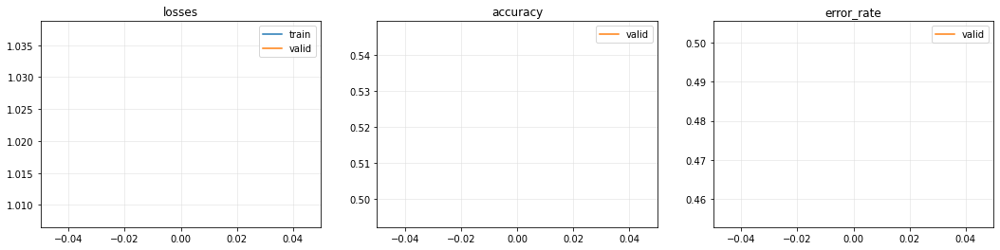

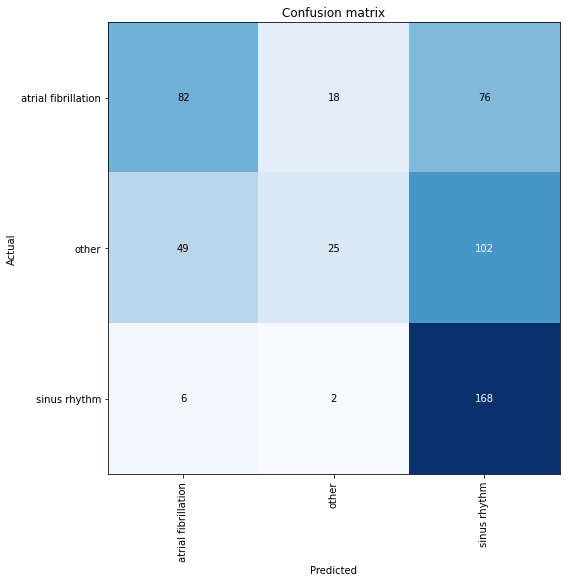

In [ ]:
for i in range(1):
    display(f'Iteration {i:4}')
    # lr_max=10**(-i-3)
    lr_max=3e-3
    print(f'lr={lr_max}')
    learn.fit_one_cycle(1, lr_max=lr_max)
    learn.plot_metrics()
    interp = ClassificationInterpretation.from_learner(learn)
    interp.plot_confusion_matrix(figsize=(8, 8))

In [ ]:
# for i in range(3):
#     display(f'Iteration {i:4}')
#     # lr_max=10**(-i-3)
#     lr_max=1e-3
#     print(f'lr={lr_max}')
#     learn.fit_one_cycle(10, lr_max=lr_max)
#     learn.plot_metrics()
#     interp = ClassificationInterpretation.from_learner(learn)
#     interp.plot_confusion_matrix(figsize=(8, 8))

### Visualize

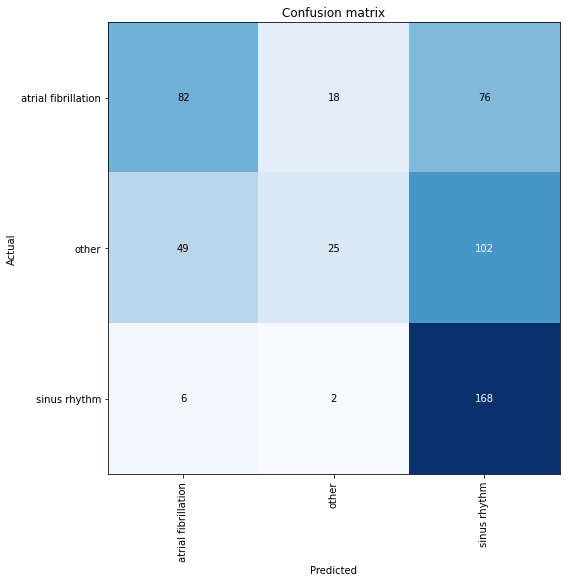

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8, 8))

In [ ]:
pip install matplotlib-venn

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# from fastai2.vision.all import *
from fastai2_extensions.interpret.all import *
interp = ClassificationInterpretationEx.from_learner(learn)
plt.style.use('ggplot')
# interp.plot_accuracy()

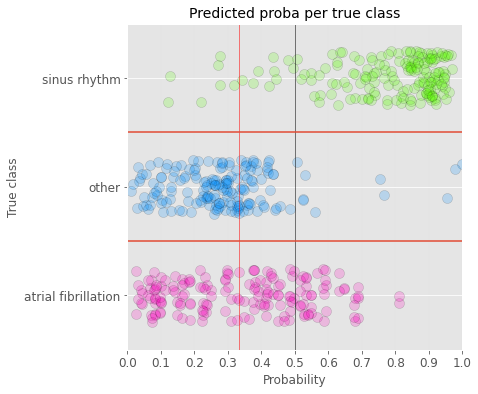

In [ ]:
learn.show_probas()

## Try many models

In [ ]:
# bs = 64
# print(X.shape)
# tfms  = [None, [Categorize()]]
# dsets = TSDatasets(X, y, tfms=tfms, splits=splits)
# dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[bs, bs*2])

# archs = [(FCN, {}), (ResNet, {}), (xresnet1d34, {}), (ResCNN, {}), 
#          #(LSTM, {'n_layers':1, 'bidirectional': False}), (LSTM, {'n_layers':2, 'bidirectional': False}), (LSTM, {'n_layers':3, 'bidirectional': False}), 
#          #(LSTM, {'n_layers':1, 'bidirectional': True}), (LSTM, {'n_layers':2, 'bidirectional': True}), (LSTM, {'n_layers':3, 'bidirectional': True}), 
#          (LSTM_FCN, {}), (LSTM_FCN, {'shuffle': False}), (InceptionTime, {}), (XceptionTime, {}), (OmniScaleCNN, {}), (mWDN, {'levels': 4})]

# results = pd.DataFrame(columns=['arch', 'hyperparams', 'total params', 'train loss', 'valid loss', 'accuracy', 'time'])
# for i, (arch, k) in enumerate(archs):
#     model = create_model(arch, dls=dls, **k)
#     print(model.__class__.__name__)
#     learn = Learner(dls, model,  metrics=accuracy, cbs=mixup)
#     start = time.time()
#     learn.fit_one_cycle(30, 1e-3)
#     elapsed = time.time() - start
#     vals = learn.recorder.values[-1]
#     results.loc[i] = [arch.__name__, k, total_params(model)[0], vals[0], vals[1], vals[2], int(elapsed)]
#     results.sort_values(by='accuracy', ascending=False, ignore_index=True, inplace=True)
#     clear_output()
#     display(results)

### Free up memory

In [ ]:
import gc
del X, y, splits, multilabel_y, datasets, x_df, y_df, ids, df_split, df, plain_df
gc.collect()

282861

# Go META

In [ ]:
from functools import lru_cache

@lru_cache(maxsize=1)   # caches the last maxsize computations, works only if this cell is not rerun
def create_df(y_to_drop_):
    print(f'Recomputing create_df {y_to_drop_}')
    # Preprocess :D
    raw_df['single_diagnosis'] = raw_df.diagnosis.map(create_diagnosis2multi_class(y_to_drop_))
    plain_df = raw_df.dropna()
    df = plain_df.groupby(level='id').apply(generate_snippets)
    df_split = df.groupby(['id', 'snippet']).head(1).groupby('single_diagnosis').apply(assign_dataset)
    ids = {type_: df_split[df_split.dataset == type_].id for type_ in ['train', 'val', 'test']}
    y_df = df.groupby(['id', 'snippet']).apply(take_y).single_diagnosis
    x_df = df.drop(columns=['diagnosis', 'single_diagnosis'])

    # Normalize data
    MEAN = x_df.loc[ids['train']].mean()
    STD = x_df.loc[ids['train']].std()
    x_df = ((x_df - MEAN ) / STD)
    return x_df, y_df, ids

In [ ]:
# %%time
import copy

def logit(text):
    log_file = data_folder / 'log.log'
    with open(log_file, 'a') as wf:
        wf.write(text)


def eval_hyperparams(y_to_drop_, y_labels_, max_extra_, max_duplicate_, mixup_alpha_, 
                     num_of_cycles_, cycle_len_, bs_, max_lr_, return_model=False):
    """
    Param ranges:
        y_to_drop_: list of cols
        max_extra_: 0<
        max_duplicate_: 0<
        mixup_alpha_: 0.0--0.6 (typically)
        num_of_cycles_: 1<
        cycle_len_: 1<
        bs_: 8--256
        max_lr_: 1e-4--5e-3
    """
    print(f'Classifying on {ALL_DIAGNOSIS.difference(y_to_drop_)} + the rest')
    # Sanitize inputs
    y_to_drop_, max_extra_, max_duplicate_, mixup_alpha_, num_of_cycles_, cycle_len_, bs_ = (
        y_to_drop_, int(max_extra_), int(max_duplicate_), mixup_alpha_, int(num_of_cycles_), int(cycle_len_), int(bs_)
    )

    x_df, y_df, ids = create_df(tuple(set(y_to_drop_)))

    # Create train data
    datasets = create_datasets(x_df, y_df, ids, max_extra_, max_duplicate_)
    X, y, splits = combine_split_data([np.swapaxes(datasets['x']['train'], 1, 2),
                                    np.swapaxes(datasets['x']['val'], 1, 2),], 
                                    [datasets['y']['train'], 
                                    datasets['y']['val']])
    # Define model
    mixup = MixUp1d(mixup_alpha_)
    tfms  = [None, [Categorize()]]
    dsets = TSDatasets(X, y, tfms=tfms, splits=splits, inplace=True)
    dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[bs_, 128], 
                                    # batch_tfms=[TSStandardize()], 
                                     num_workers=0)
    model = InceptionTime(dls.vars, dls.c)
    learn = Learner(dls, model, metrics=[accuracy, ], cbs=mixup)

    max_F1 = 0.0
    best_model = None
    # Train
    for i in range(num_of_cycles_):
        display(f'Iteration {i:4}')
        lr_max=3e-3
        learn.fit_one_cycle(cycle_len_, lr_max=lr_max)
        learn.plot_metrics()
        interp = ClassificationInterpretation.from_learner(learn)
        interp.plot_confusion_matrix(figsize=(8, 8))
        
        # Compute metric
        F1s = [compute_f1(learn, y_df, y_label_) for y_label_ in y_labels_]
        print('\n'.join([f'{y_label_} F1 score == {F1:2.4}' for y_label_, F1 in zip(y_labels_, F1s)]))
        max_F1 = max(F1s[0], max_F1)
        if return_model and max_F1 == F1s[0]:
            best_model = copy.deepcopy(learn)
    logit(f'{max_F1:2.4f}|')
    
    if return_model:
        return best_model
    return max_F1


def generate_eval_hyperparams(y_to_drop_, y_label_, k_avg=1):
    """
    y_labels_: the first will be used to compute F1, the rest is just to see results
    k_avg: average the validation over k_avg runs
    """
    def wrapper_eval_hyperparams(*args, **kwargs):
        logit(f'\n{kwargs}\n')
        res_ = np.array([eval_hyperparams(y_to_drop_, y_label_, *args, **kwargs) 
                         for _ in range(k_avg)])
        logit(f'|{res_.mean():2.4f}\n')
        return res_.mean()
    return wrapper_eval_hyperparams

Y_LABELS = ['premature ventricular beat', 'atrial fibrillation']

Y_TO_DROP_ = [
    'sinus rhythm', 
    'noisy ECG', 
    'tachycardia', 
    'myocardial infarction',
    'bradycardia', 
    'STT changes', 
    'atrial fibrillation', 
    'premature atrial beat',
#     'premature ventricular beat',   # Of interest
    'left bundle brunch block', 
    '1st degree AV block',
    'right bundle brunch block', 
    'supraventricular rhythm',
    'ventricular stimulation', 
    'atrial flutter', 
    'atrial stimulation',
    'ventricular preexcitation',
    'atrial rhythm',
    '3rd degree AV block',
    '2nd degree AV block',
    'non-specific intraventricular block',
    'ventricular rhythm',
    'SA block',
    'ventricular trigeminy'
]
Y_TO_USE_ = [
    'sinus rhythm', 
    'noisy ECG', 
    'tachycardia', 
    'myocardial infarction',
    'bradycardia', 
    'STT changes', 
    'atrial fibrillation', 
    'premature atrial beat',
    'premature ventricular beat',   # Of interest
]


# res = generate_eval_hyperparams(ALL_DIAGNOSIS.difference(Y_TO_USE_), Y_LABELS, 2)(max_extra_=0, max_duplicate_=3, 
#                                                         mixup_alpha_=0.35, num_of_cycles_=2, 
#                                                         cycle_len_=2, bs_=64, max_lr_=3e-3)
# res

In [ ]:
!cat data/log.log

{'bs_': 29.348412234180813, 'cycle_len_': 12.407620962612585, 'max_duplicate_': 3.927243773303809, 'max_extra_': 1.1967183099098762, 'max_lr_': 0.000864491338167939, 'mixup_alpha_': 0.15599452033620265, 'num_of_cycles_': 15.00580836121682}
0.7143|
y_to_use_:
['sinus rhythm', 'tachycardia', 'myocardial infarction', 'bradycardia', 'atrial fibrillation', 'premature atrial beat', 'premature ventricular beat']

{'bs_': 29.348412234180813, 'cycle_len_': 12.407620962612585, 'max_duplicate_': 3.927243773303809, 'max_extra_': 2.992693762500986, 'max_lr_': 0.000864491338167939, 'mixup_alpha_': 0.15599452033620265, 'num_of_cycles_': 15.00580836121682}
0.7934|0.7907|0.7500||0.7780

{'bs_': 57.37117413302553, 'cycle_len_': 8.212779025906762, 'max_duplicate_': 3.831582238606386, 'max_extra_': 0.10290188698471643, 'max_lr_': 0.0048525582755937725, 'mixup_alpha_': 0.8324426408004217, 'num_of_cycles_': 15.021233911067828}
0.7391|0.7391|0.7164||0.7316

{'bs_': 18.363841305837525, 'cycle_len_': 3.2006707

In [ ]:
del res

NameError: name 'res' is not defined

### CAM & friends

Classifying on {'sinus rhythm', 'premature ventricular beat'} + the rest
Recomputing create_df ('tachycardia', '3rd degree AV block', 'atrial stimulation', 'ventricular trigeminy', 'STT changes', 'supraventricular rhythm', 'myocardial infarction', 'right bundle brunch block', 'non-specific intraventricular block', 'ventricular rhythm', 'premature atrial beat', 'left bundle brunch block', 'atrial fibrillation', '2nd degree AV block', 'atrial flutter', 'ventricular preexcitation', 'ventricular stimulation', 'SA block', '1st degree AV block', 'atrial rhythm', 'bradycardia', 'noisy ECG')


other                         2961
sinus rhythm                  1563
premature ventricular beat     288
Name: single_diagnosis, dtype: int64


create_datasets | train y_arr minimum: 288
sinus rhythm 864
other 864
premature ventricular beat 288
(2592, 2500, 12) (2592,)


other                         635
sinus rhythm                  335
premature ventricular beat     62
Name: single_diagnosis, dtype: int64


create_datasets | val y_arr minimum: 62
sinus rhythm 186
other 186
premature ventricular beat 62
(558, 2500, 12) (558,)


other                         635
sinus rhythm                  336
premature ventricular beat     62
Name: single_diagnosis, dtype: int64


create_datasets | test y_arr minimum: 62
sinus rhythm 186
other 186
premature ventricular beat 62
(558, 2500, 12) (558,)


'Iteration    0'

epoch,train_loss,valid_loss,accuracy,time
0,0.990219,0.960453,0.534050,00:03
1,0.985482,0.867152,0.591398,00:03
2,0.960100,0.883669,0.587814,00:03
3,0.933237,0.941893,0.593190,00:03
4,0.918009,0.832523,0.611111,00:03
5,0.874351,0.799588,0.659498,00:03
6,0.843209,0.780930,0.661290,00:03


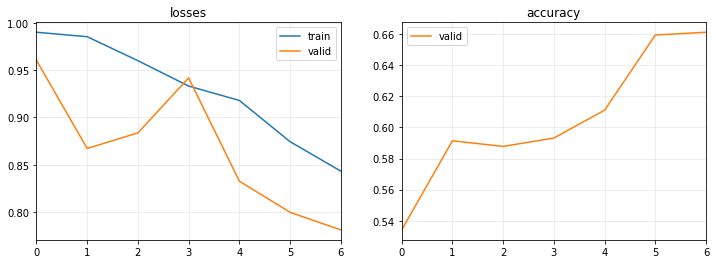

premature ventricular beat F1 score == 0.7325
atrial fibrillation F1 score == -1.0


'Iteration    1'

epoch,train_loss,valid_loss,accuracy,time
0,0.861283,0.845361,0.605735,00:03
1,0.899237,0.997489,0.516129,00:03
2,0.883858,0.990971,0.591398,00:03
3,0.868731,0.852703,0.596774,00:03
4,0.831568,0.777518,0.621864,00:03
5,0.793597,0.766132,0.652330,00:03
6,0.774288,0.748510,0.663082,00:03


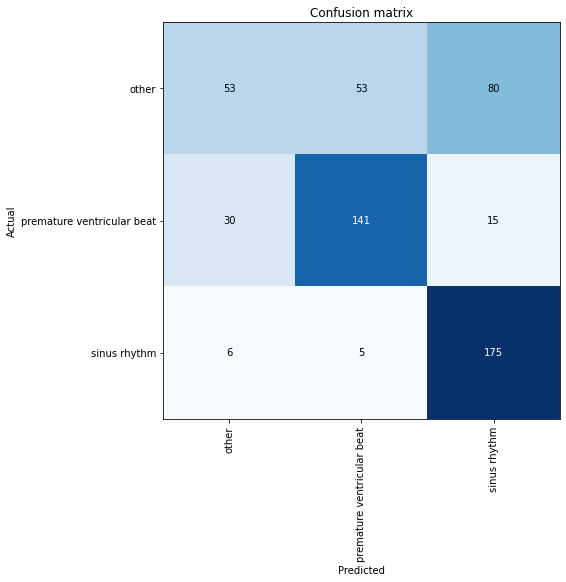

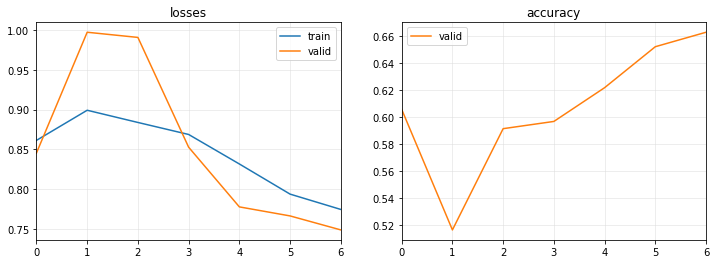

premature ventricular beat F1 score == 0.708
atrial fibrillation F1 score == -1.0


'Iteration    2'

epoch,train_loss,valid_loss,accuracy,time
0,0.789030,0.945881,0.569892,00:03
1,0.832702,0.895333,0.596774,00:03
2,0.846288,0.750949,0.679211,00:03
3,0.806271,0.776659,0.715054,00:03
4,0.786705,0.751570,0.689964,00:03
5,0.742897,0.732323,0.732975,00:03
6,0.713345,0.733892,0.715054,00:03


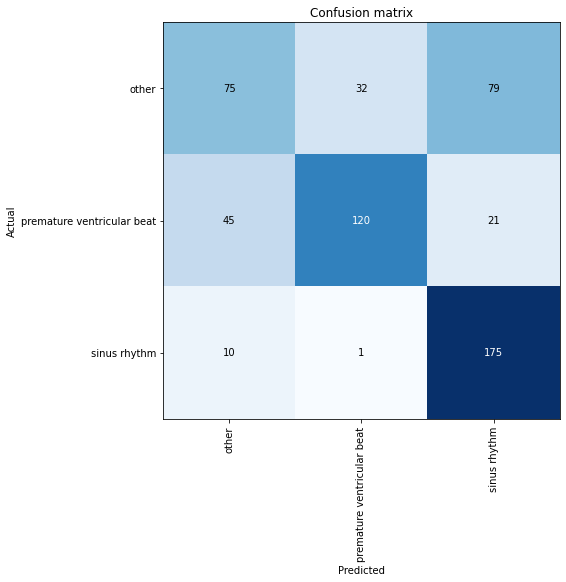

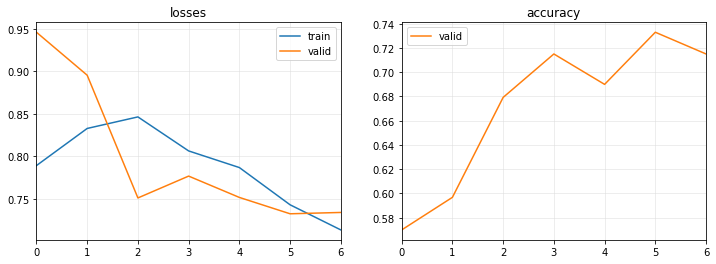

premature ventricular beat F1 score == 0.7317
atrial fibrillation F1 score == -1.0


'Iteration    3'

epoch,train_loss,valid_loss,accuracy,time
0,0.719363,0.816358,0.688172,00:03
1,0.795100,0.775195,0.681004,00:03
2,0.783907,0.793585,0.727599,00:03
3,0.745697,0.697829,0.732975,00:03
4,0.716967,0.725785,0.702509,00:03
5,0.679581,0.723102,0.716846,00:03
6,0.662489,0.742917,0.727599,00:03


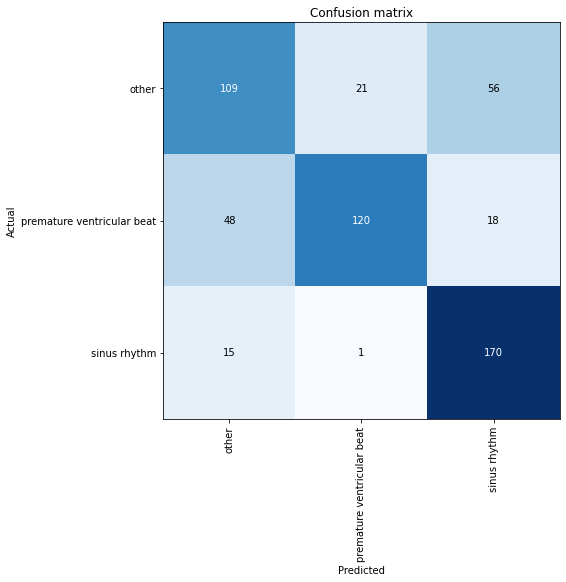

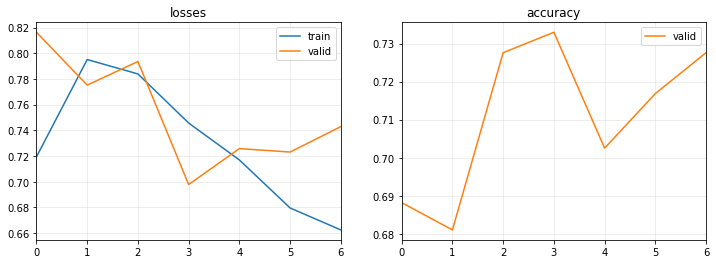

premature ventricular beat F1 score == 0.7405
atrial fibrillation F1 score == -1.0


'Iteration    4'

epoch,train_loss,valid_loss,accuracy,time
0,0.660929,0.758444,0.732975,00:03
1,0.719244,1.240901,0.747312,00:03
2,0.727765,0.826966,0.720430,00:03
3,0.699239,0.739720,0.720430,00:03
4,0.663048,0.735662,0.758065,00:03
5,0.659014,0.745350,0.711470,00:03
6,0.625644,0.706997,0.734767,00:03


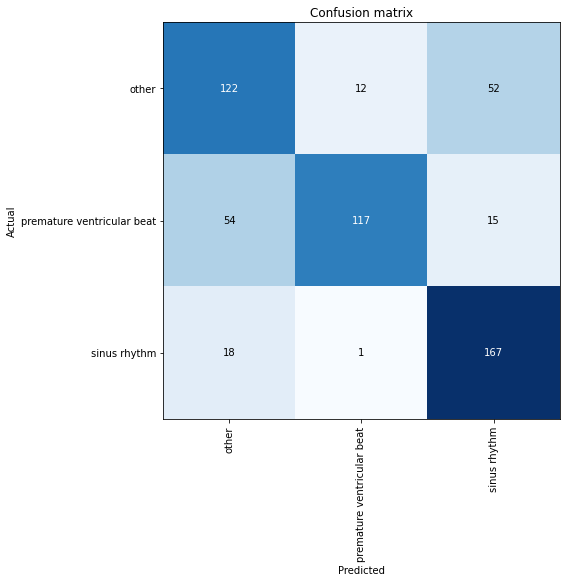

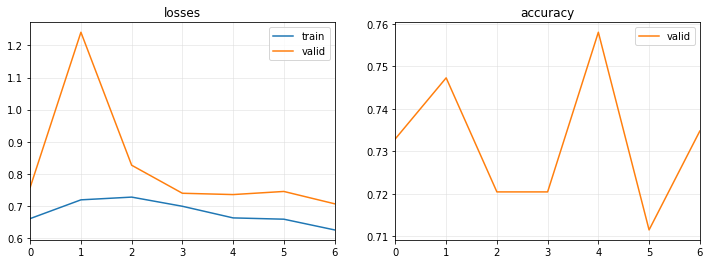

premature ventricular beat F1 score == 0.7429
atrial fibrillation F1 score == -1.0


'Iteration    5'

epoch,train_loss,valid_loss,accuracy,time
0,0.638341,0.806821,0.722222,00:03
1,0.698706,0.831153,0.729391,00:03
2,0.722666,0.689255,0.718638,00:03
3,0.689612,0.791942,0.709677,00:03
4,0.661630,0.811355,0.693548,00:03
5,0.616781,0.752033,0.715054,00:03
6,0.614226,0.759663,0.715054,00:03


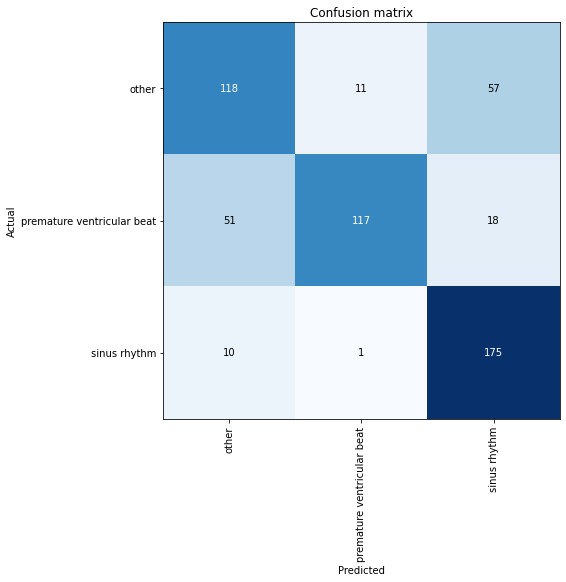

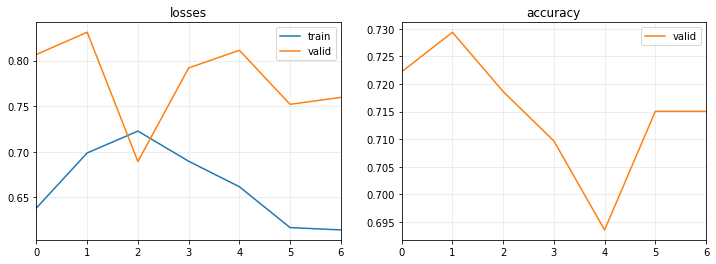

premature ventricular beat F1 score == 0.717
atrial fibrillation F1 score == -1.0


'Iteration    6'

epoch,train_loss,valid_loss,accuracy,time
0,0.600800,0.770756,0.752688,00:03
1,0.671193,0.769372,0.724014,00:03
2,0.694087,0.748525,0.743728,00:03
3,0.664768,0.776776,0.722222,00:03
4,0.647666,0.733938,0.691756,00:03
5,0.602578,0.726172,0.713262,00:03
6,0.570749,0.722653,0.729391,00:03


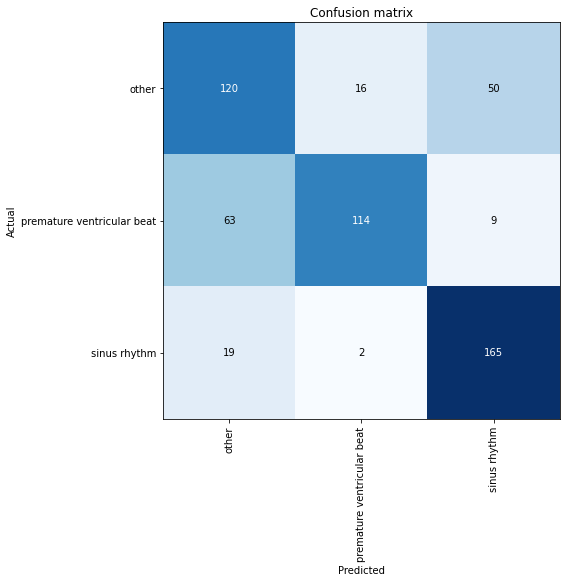

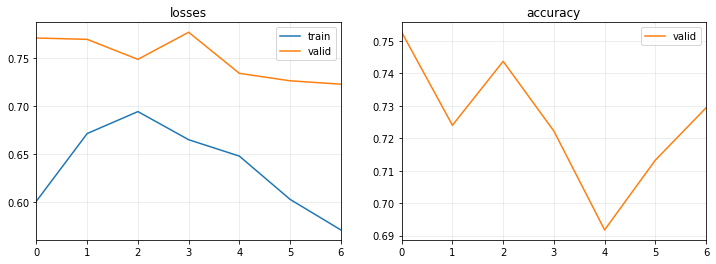

premature ventricular beat F1 score == 0.7524
atrial fibrillation F1 score == -1.0


'Iteration    7'

epoch,train_loss,valid_loss,accuracy,time
0,0.587246,0.764344,0.711470,00:03
1,0.664842,0.803615,0.749104,00:03
2,0.681699,0.809857,0.672043,00:03
3,0.655445,0.740201,0.691756,00:03
4,0.635022,0.875806,0.688172,00:03
5,0.596277,0.758002,0.706093,00:03
6,0.561377,0.766730,0.738351,00:03


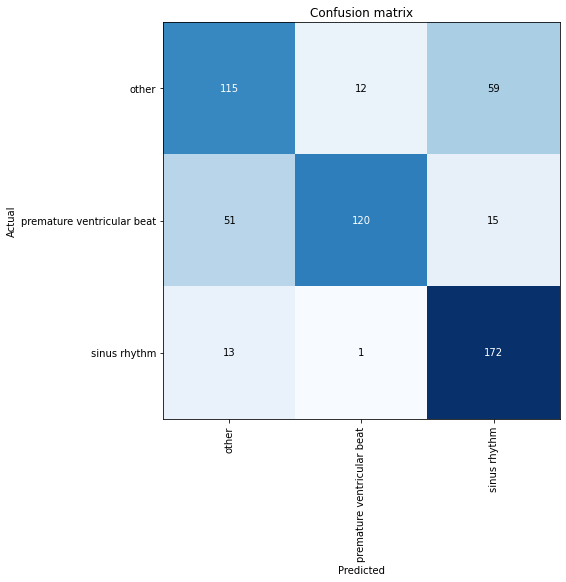

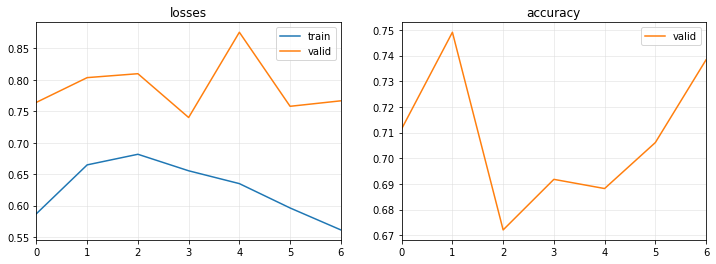

premature ventricular beat F1 score == 0.7593
atrial fibrillation F1 score == -1.0
CPU times: user 11min 40s, sys: 7.17 s, total: 11min 47s
Wall time: 5min 10s


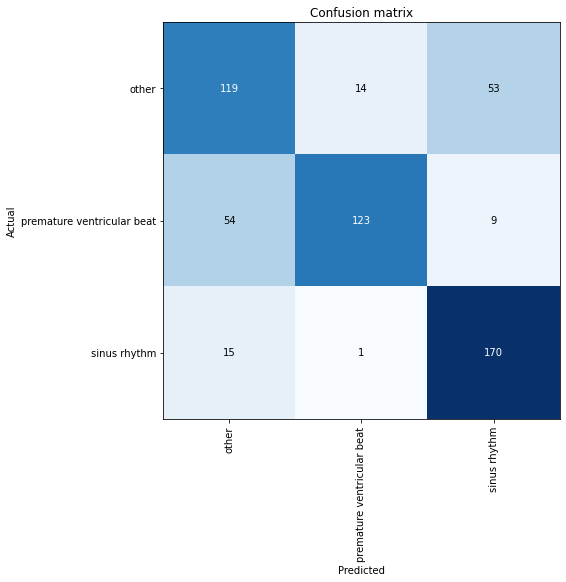

In [ ]:
%%time
y_to_use_ = ['sinus rhythm', 'noisy ECG', 'tachycardia', 'myocardial infarction', 'bradycardia', 'STT changes', 'atrial fibrillation', 'premature atrial beat', 'premature ventricular beat']
y_to_use_ = ['sinus rhythm', 'premature ventricular beat']
kwargs = {'bs_': 32, 'cycle_len_': 7.240799865584679, 'max_duplicate_': 3, 'max_extra_': 0, 'max_lr_': 0.005, 'mixup_alpha_': 0.3, 'num_of_cycles_': 8.1}

model = eval_hyperparams(ALL_DIAGNOSIS.difference(y_to_use_), Y_LABELS, return_model=True, **kwargs)
model

In [ ]:
x_df, y_df, ids = create_df(tuple(set(ALL_DIAGNOSIS.difference(y_to_use_))))

# Create train data
datasets = create_datasets(x_df, y_df, ids, int(kwargs['max_extra_']), int(kwargs['max_duplicate_']))
X, y, splits = combine_split_data([np.swapaxes(datasets['x']['train'], 1, 2),
                                np.swapaxes(datasets['x']['val'], 1, 2),], 
                                [datasets['y']['train'], 
                                datasets['y']['val']])

other                         2961
sinus rhythm                  1563
premature ventricular beat     288
Name: single_diagnosis, dtype: int64


create_datasets | train y_arr minimum: 288
sinus rhythm 864
other 864
premature ventricular beat 288
(2592, 2500, 12) (2592,)


other                         635
sinus rhythm                  335
premature ventricular beat     62
Name: single_diagnosis, dtype: int64


create_datasets | val y_arr minimum: 62
sinus rhythm 186
other 186
premature ventricular beat 62
(558, 2500, 12) (558,)


other                         635
sinus rhythm                  336
premature ventricular beat     62
Name: single_diagnosis, dtype: int64


create_datasets | test y_arr minimum: 62
sinus rhythm 186
other 186
premature ventricular beat 62
(558, 2500, 12) (558,)


In [ ]:
np.argsort(y == 'premature ventricular beat')

array([   0, 1408, 1407, ..., 2195, 2171, 3149])

<AxesSubplot:>

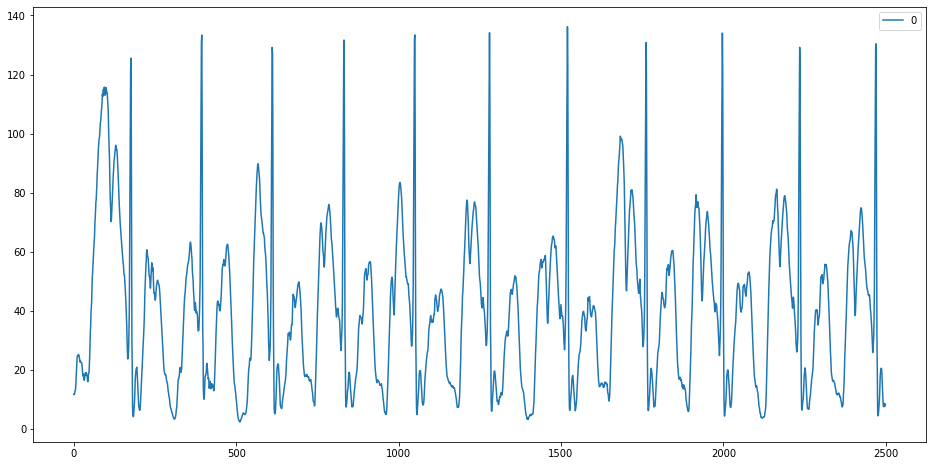

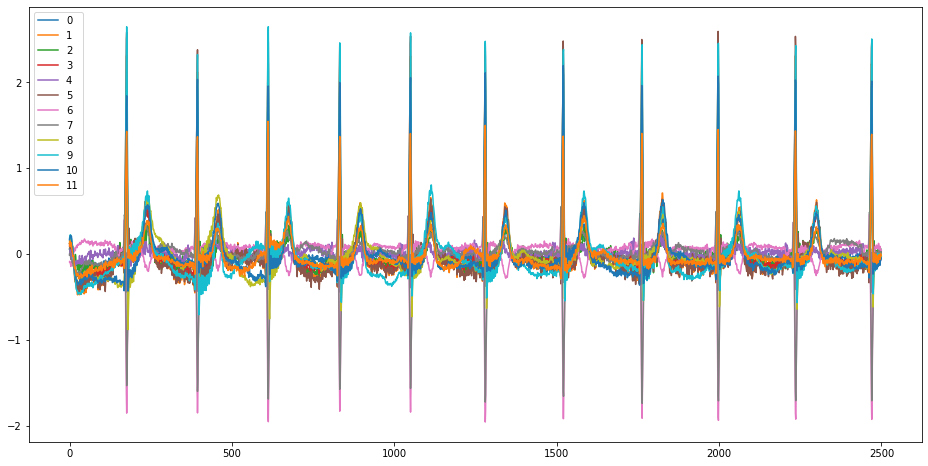

In [ ]:
def get_id_ACT(id_=None, x_numpy=None):
    layer = dict(model.model.named_modules())['inceptionblock.act'] # select layer to show
    if id_ is not None:
        x_numpy = X[id_:id_+1]
    x = torch.from_numpy(x_numpy).type(torch.cuda.FloatTensor) # dataset to the GPU format
#     print(f'Working on {y[id_]}')
    
    class Hook():   # a hook to store all activations
        def hook_func(self, m, i, o): self.stored = o.detach().clone()

    hook_output = Hook()
    # hook = learn.model[0].register_forward_hook(hook_output.hook_func)
    # hook = learn.model.register_forward_hook(hook_output.hook_func)
    hook = layer.register_forward_hook(hook_output.hook_func) # add storage hook to the layer

    with torch.no_grad(): output = model.model.eval()(x) # forward pass in eval mode
    act = hook_output.stored[0] # get the stored activations
#     print(output)
    # print(act.shape)
    df = pd.DataFrame(act.detach().cpu().sum(0)) # transfer activations to CPU and sum per tick
#     df = pd.DataFrame(act.detach().cpu())
    return df

id_ = 0
df = get_id_ACT(id_)
df.plot(figsize=(16, 8))
# df.describe()
pd.DataFrame(X[id_:id_+1].sum(0).T).plot(figsize=(16, 8))

In [ ]:
from collections import defaultdict
res = defaultdict(list)

type_ = 'val'
x_arr = np.swapaxes(datasets['x'][type_], 1, 2)
for id_ in range(0, len(datasets['y'][type_]), 3):
    df = get_id_ACT(x_numpy=x_arr[id_:id_+1])
    res[datasets['y'][type_][id_]].append(df)

{'other': {True: 124, False: 0}, 'premature ventricular beat': {True: 62, False: 0}}
{'other': {True: 124, False: 0}, 'premature ventricular beat': {True: 62, False: 0}} 0.3315508021390374 0.9841269841269841 0.49599962300828654
{'other': {True: 124, False: 0}, 'premature ventricular beat': {True: 62, False: 0}}
{'other': {True: 124, False: 0}, 'premature ventricular beat': {True: 62, False: 0}} 0.3315508021390374 0.9841269841269841 0.49599962300828654
{'other': {True: 123, False: 1}, 'premature ventricular beat': {True: 62, False: 0}}
{'other': {True: 123, False: 1}, 'premature ventricular beat': {True: 62, False: 0}} 0.3333333333333333 0.9841269841269841 0.49799158987786957
{'other': {True: 97, False: 27}, 'premature ventricular beat': {True: 61, False: 1}}
{'other': {True: 97, False: 27}, 'premature ventricular beat': {True: 61, False: 1}} 0.3836477987421384 0.9682539682539683 0.5495491430487546
{'other': {True: 58, False: 66}, 'premature ventricular beat': {True: 58, False: 4}}
{'ot

P     0.806452
R     0.984127
F1    0.742857
dtype: float64

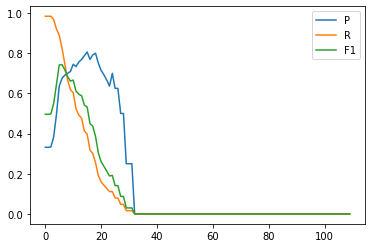

In [ ]:
def test_thresh(th):
    other_cls = 'other'#'sinus rhythm'#'other'
    clasify_cls = 'premature ventricular beat'
    hit = {other_cls: {True: 0, False: 0}, clasify_cls: {True: 0, False: 0}}

    for name, l in res.items():
        if name not in hit:
#             continue
            name = other_cls
#         print(name)
        # print(pd.concat([x.describe().T for x in l]).mean(0))
        for x in l:
            hit[name][x.describe().T['max'].values[0] > th] += 1

#     print(hit)
    P = hit[clasify_cls][True]/(hit[clasify_cls][True] + hit[other_cls][True] + 1)
    R = hit[clasify_cls][True]/(hit[clasify_cls][True] + hit[clasify_cls][False] + 1)
    F1 = 2 * (P * R) / (P + R + 1e-6)
    print(hit, P, R, F1)
    return P, R, F1

max_ = max(b[0].max() for a in res.values() for b in a) / 100
threshes = range(0, 110, 1)
df = pd.DataFrame([test_thresh(x * max_) for x in threshes], columns=['P', 'R', 'F1'], index=threshes)
df.plot()
df.max()

#### CAM

Working on premature ventricular beat
tensor([[0.4593, 0.2987, 0.2420]], device='cuda:0', grad_fn=<SoftmaxBackward>)
{'other': 0.45928847789764404, 'premature ventricular beat': 0.29866236448287964, 'sinus rhythm': 0.2420492172241211}
Working on premature ventricular beat
tensor([[0.0213, 0.7194, 0.2594]], device='cuda:0', grad_fn=<SoftmaxBackward>)
{'other': 0.021262280642986298, 'premature ventricular beat': 0.7193516492843628, 'sinus rhythm': 0.2593860328197479}
Working on premature ventricular beat
tensor([[0.0209, 0.7673, 0.2118]], device='cuda:0', grad_fn=<SoftmaxBackward>)
{'other': 0.020947687327861786, 'premature ventricular beat': 0.7672921419143677, 'sinus rhythm': 0.21176011860370636}
Working on premature ventricular beat
tensor([[0.4642, 0.4979, 0.0379]], device='cuda:0', grad_fn=<SoftmaxBackward>)
{'other': 0.4642435610294342, 'premature ventricular beat': 0.4978949725627899, 'sinus rhythm': 0.037861526012420654}
Working on premature ventricular beat
tensor([[0.0167, 0.96

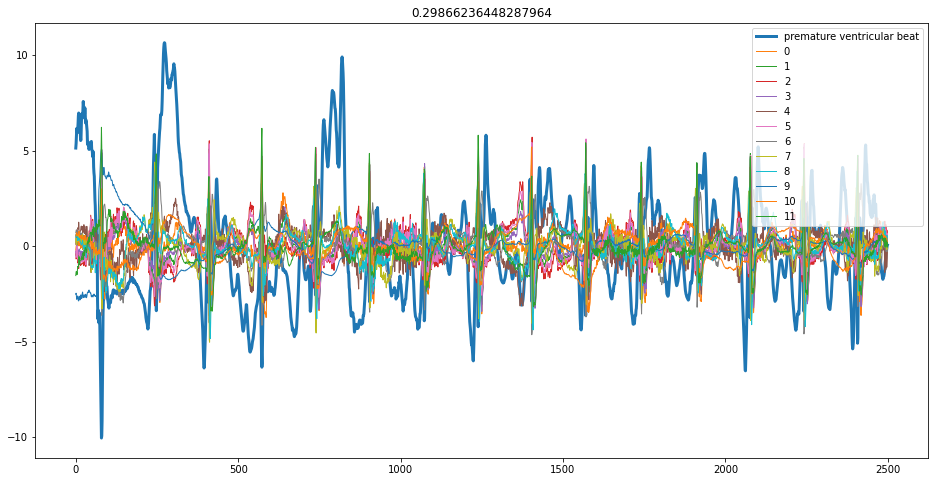

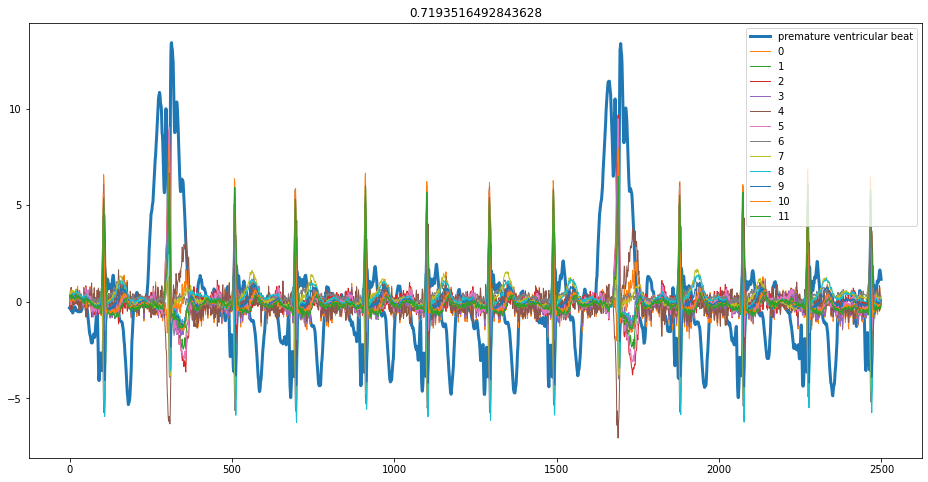

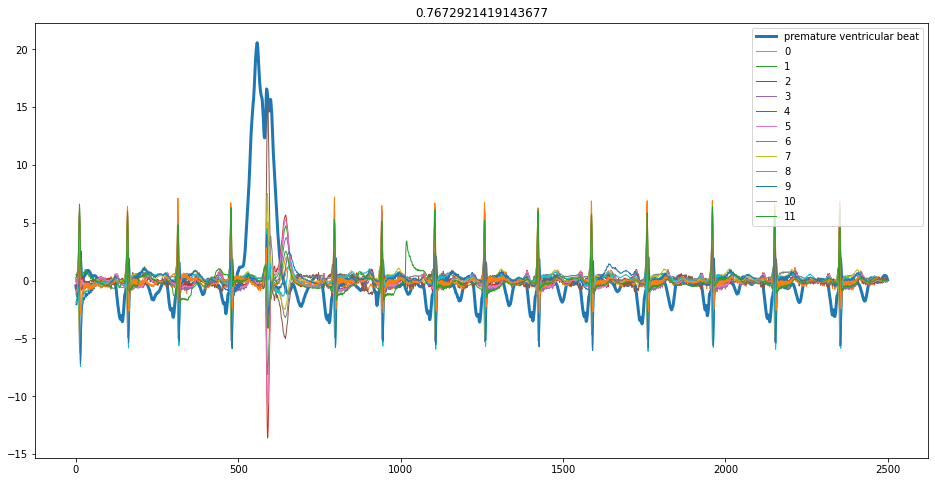

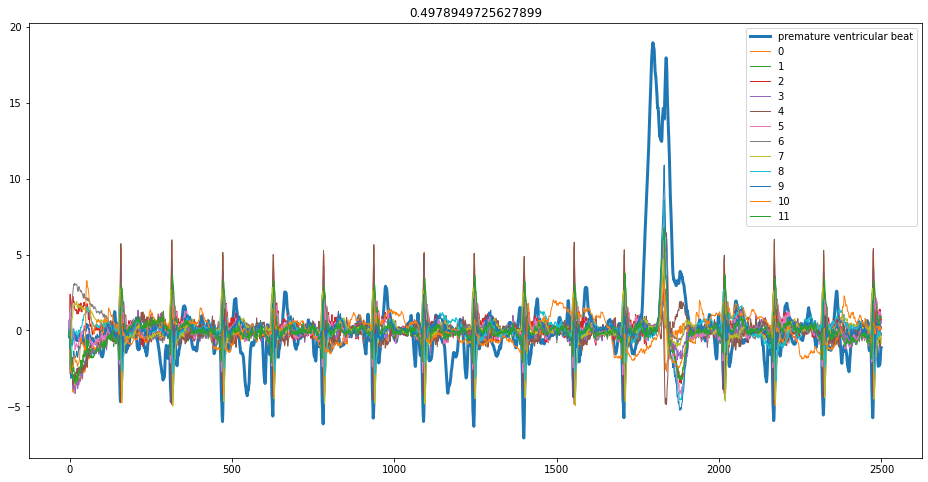

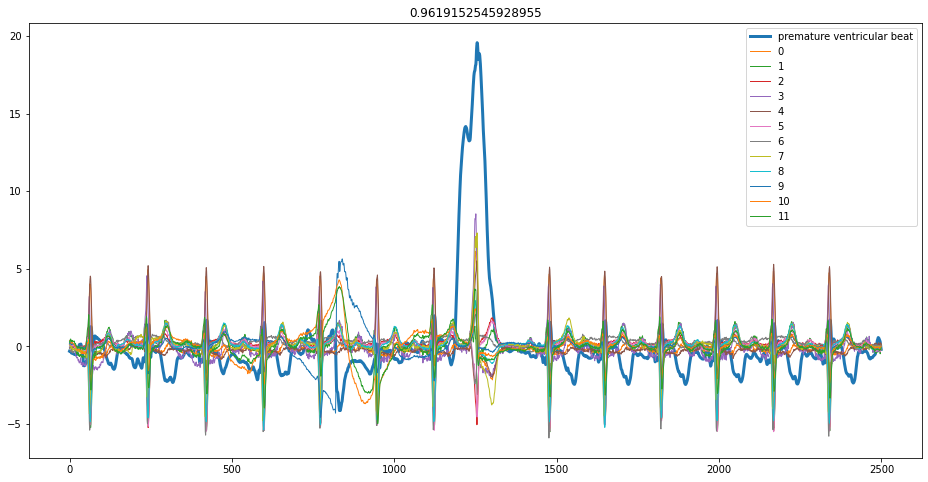

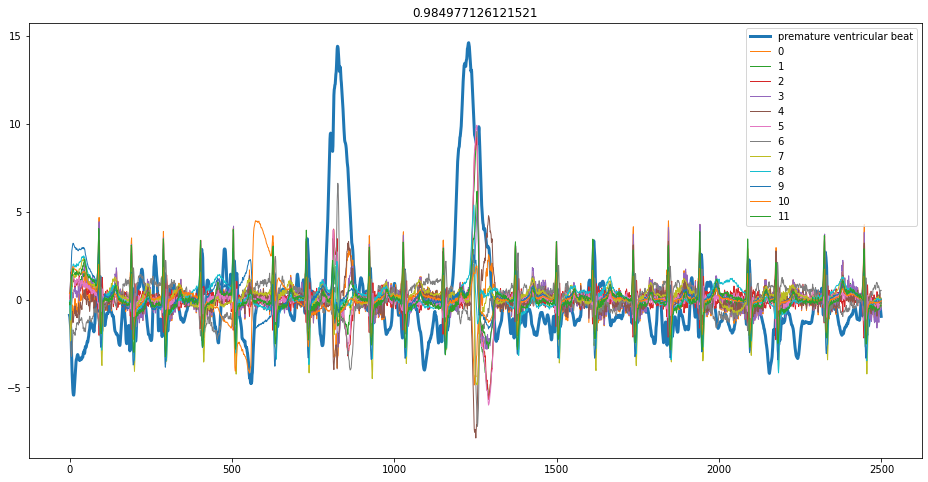

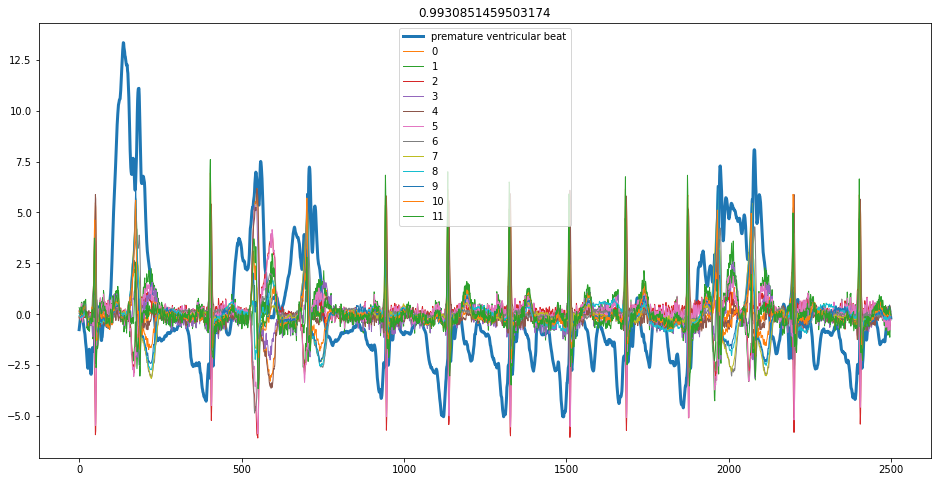

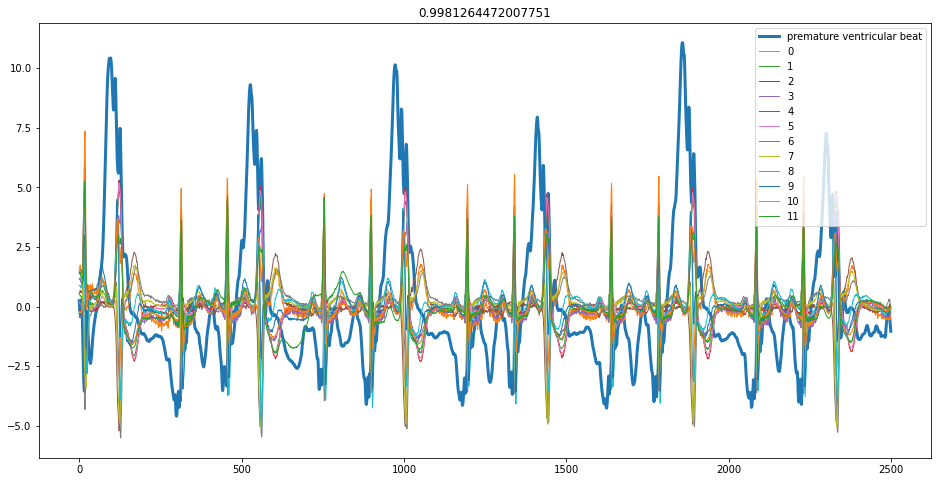

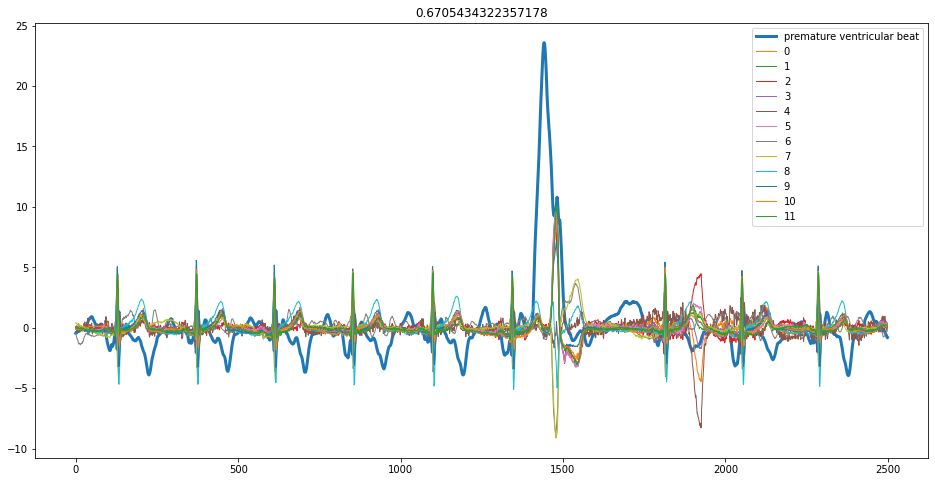

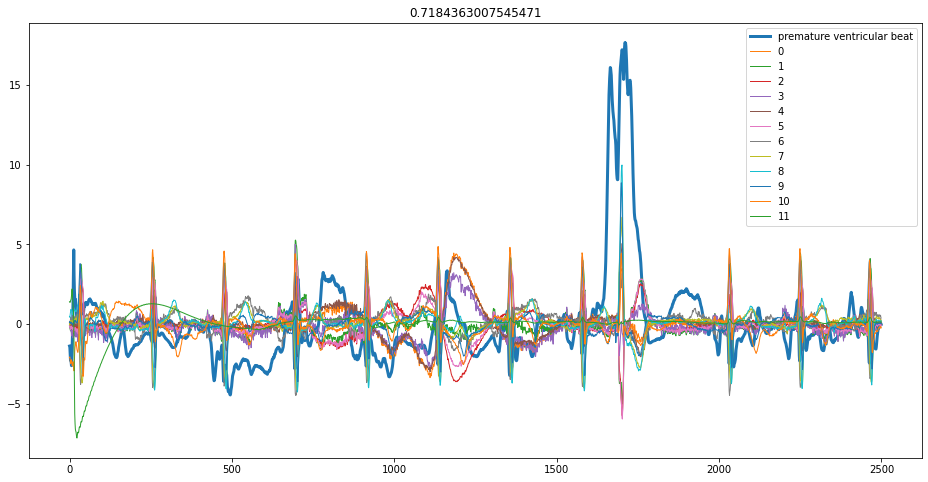

In [ ]:
y_cls = sorted(set(y))

def get_id_CAM(id_=None, x_numpy=None):
    layer = dict(model.model.named_modules())['inceptionblock.act'] # select layer to show
#     layer = dict(model.model.named_modules())['inceptionblock.inception.5.act'] # select layer to show
    if id_ is not None:
        x_numpy = X[id_:id_+1]
    x = torch.from_numpy(x_numpy).type(torch.cuda.FloatTensor) # dataset to the GPU format
    print(f'Working on {y[id_]}')

    class Hook():
        def __init__(self, m):
            self.hook = m.register_forward_hook(self.hook_func)   
        def hook_func(self, m, i, o): self.stored = o.detach().clone()
        def __enter__(self, *args): return self
        def __exit__(self, *args): self.hook.remove()
    
    class HookBwd():
        def __init__(self, m):
            self.hook = m.register_backward_hook(self.hook_func)   
        def hook_func(self, m, gi, go): self.stored = go[0].detach().clone()
        def __enter__(self, *args): return self
        def __exit__(self, *args): self.hook.remove()

    res_ = {}
    for cls_id, cls in enumerate(y_cls):
        with HookBwd(layer) as hookg:
            with Hook(layer) as hook:
                output = model.model.eval()(x.cuda())
                act = hook.stored
            output[0,cls_id].backward()
            grad = hookg.stored

        w = grad[0].mean(dim=[1], keepdim=True)
        cam_map = (w * act[0]).sum(0)
        res_[cls] = cam_map.detach().cpu()
        
    df = pd.DataFrame(res_) # transfer activations to CPU and sum per tick
    return df, dict(zip(y_cls, nn.Softmax(dim=1)(output).detach().cpu().flatten().tolist()))

for id_ in list(np.arange(len(y))[y == 'premature ventricular beat'])[:30:3]:
#     id_ = 2195#1441#1269#, 1276, 2099
    df, title = get_id_CAM(id_)
    print(title)
    df = 3 * (df-df.mean()) / df.std()
    ax = df['premature ventricular beat'].to_frame().plot(figsize=(16, 8), linewidth=3, title=title['premature ventricular beat'])
    # df.describe()
    df = pd.DataFrame(X[id_:id_+1].sum(0).T)
    df = (df-df.mean()) / df.std()
    df.plot(figsize=(16, 8), ax=ax, alpha=1, linewidth=1)
    0.0002222950220108032

In [ ]:
from collections import defaultdict
res = defaultdict(list)

type_ = 'val'
x_arr = np.swapaxes(datasets['x'][type_], 1, 2)
for id_ in range(0, len(datasets['y'][type_]), 3):
    df, title = get_id_CAM(x_numpy=x_arr[id_:id_+1])
    res[datasets['y'][type_][id_]].append(df['premature ventricular beat'])

Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.6276, 0.0910, 0.2815]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.0015, 0.9969, 0.0016]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.0472, 0.0213, 0.9315]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.0876, 0.0245, 0.8878]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  

{'other': {True: 124, False: 0}, 'premature ventricular beat': {True: 62, False: 0}}
{'other': {True: 124, False: 0}, 'premature ventricular beat': {True: 62, False: 0}} 0.3315508021390374 0.9841269841269841 0.49599962300828654
{'other': {True: 123, False: 1}, 'premature ventricular beat': {True: 62, False: 0}}
{'other': {True: 123, False: 1}, 'premature ventricular beat': {True: 62, False: 0}} 0.3333333333333333 0.9841269841269841 0.49799158987786957
{'other': {True: 111, False: 13}, 'premature ventricular beat': {True: 62, False: 0}}
{'other': {True: 111, False: 13}, 'premature ventricular beat': {True: 62, False: 0}} 0.3563218390804598 0.9841269841269841 0.5232063607330798
{'other': {True: 71, False: 53}, 'premature ventricular beat': {True: 58, False: 4}}
{'other': {True: 71, False: 53}, 'premature ventricular beat': {True: 58, False: 4}} 0.4461538461538462 0.9206349206349206 0.6010358296870247
{'other': {True: 34, False: 90}, 'premature ventricular beat': {True: 56, False: 6}}
{'o

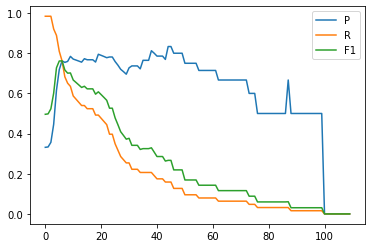

In [ ]:
def test_thresh(th):
    other_cls = 'other'#'sinus rhythm'#'other'
    clasify_cls = 'premature ventricular beat'
    hit = {other_cls: {True: 0, False: 0}, clasify_cls: {True: 0, False: 0}}

    for name, l in res.items():
        if name not in hit:
#             continue
            name = other_cls
#         print(name)
        # print(pd.concat([x.describe().T for x in l]).mean(0))
        for x in l:
#             print(th, x.max(), x.max() > th)
            hit[name][x.max() > th] += 1

    print(hit)
    P = hit[clasify_cls][True]/(hit[clasify_cls][True] + hit[other_cls][True] + 1)
    R = hit[clasify_cls][True]/(hit[clasify_cls][True] + hit[clasify_cls][False] + 1)
    F1 = 2 * (P * R) / (P + R + 1e-6)
    print(hit, P, R, F1)
    return P, R, F1

max_ = max(b.max() for a in res.values() for b in a) / 100
threshes = range(0, 110, 1)
df = pd.DataFrame([test_thresh(x * max_) for x in threshes], columns=['P', 'R', 'F1'], index=threshes)
df.plot()
print(df.max())
print(f'max value {max_:3.4f} | optimal F1 {df.F1.argmax() / 100 * max_}')

#### No processing

(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (2500,)
(12, 2500) (

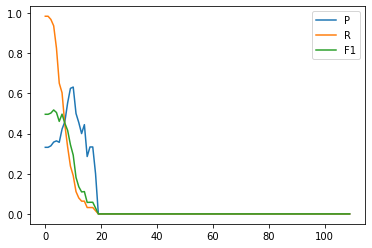

In [ ]:
from collections import defaultdict
res = defaultdict(list)

type_ = 'val'
x_arr = np.swapaxes(datasets['x'][type_], 1, 2)
for id_ in range(0, len(datasets['y'][type_]), 3):
    print(x_arr[id_].shape, x_arr[id_].sum(0).shape)
    res[datasets['y'][type_][id_]].append(x_arr[id_].sum(0))
    
def test_thresh(th):
    other_cls = 'other'#'sinus rhythm'#'other'
    clasify_cls = 'premature ventricular beat'
    hit = {other_cls: {True: 0, False: 0}, clasify_cls: {True: 0, False: 0}}

    for name, l in res.items():
        if name not in hit:
#             continue
            name = other_cls
#         print(name)
        # print(pd.concat([x.describe().T for x in l]).mean(0))
        for x in l:
#             print(th, x.max(), x.max() > th)
            hit[name][x.max() > th] += 1

    print(hit)
    P = hit[clasify_cls][True]/(hit[clasify_cls][True] + hit[other_cls][True] + 1)
    R = hit[clasify_cls][True]/(hit[clasify_cls][True] + hit[clasify_cls][False] + 1)
    F1 = 2 * (P * R) / (P + R + 1e-6)
    print(hit, P, R, F1)
    return P, R, F1

max_ = max(b.max() for a in res.values() for b in a) / 100
threshes = range(0, 110, 1)
df = pd.DataFrame([test_thresh(x * max_) for x in threshes], columns=['P', 'R', 'F1'], index=threshes)
df.plot()
print(df.max())
print(f'max value {max_:3.4f} | optimal F1 {df.F1.argmax() / 100 * max_}')

### Visualize

Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.4593, 0.2987, 0.2420]], device='cuda:0', grad_fn=<SoftmaxBackward>)


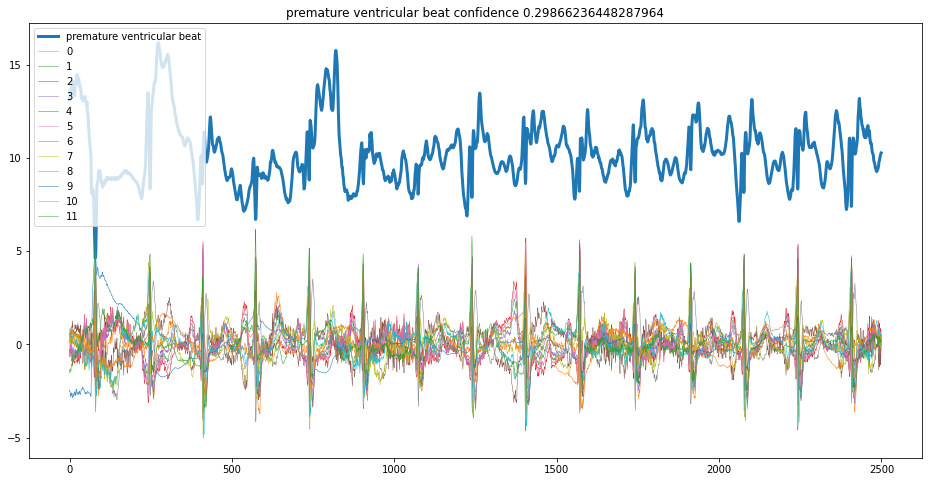

In [ ]:
# TODO: Maybe https://stackoverflow.com/questions/47687414/matplotlib-color-line-by-value ?

def show_activation(X_, out_col='premature ventricular beat', thresh=None, thresh_quantile=None):
    """
    Show rescaled activation along with the original signal
    
    thresh: Show threshed and smoothed activation
    thresh_quantile: Show relatively threshed and smoothed activation
    """
    res_, title = get_id_CAM(x_numpy=X_)
    pvb = res_[out_col]
    df = pd.DataFrame(X_.sum(0).T)
    df = (df-df.mean()) / df.std()
    
    if thresh_quantile is not None:
        thresh = pvb.quantile(thresh_quantile)
    if thresh is not None:
        pvb = (pvb > thresh).astype(float)
        # TODO: a better threshhold?
        # TODO: Find distribution and hyper params so taht the bumps look nice
    #     pvb = pvb.rolling(70, center=True, win_type='exponential', ).mean(tau=20)
        pvb = pvb.rolling(70, center=True, win_type='gaussian', ).mean(std=20)
    pvb = pvb / (pvb.max() + 1e-5) * df.max().max() + 10

    ax = pvb.to_frame().astype('float').plot(figsize=(16, 8), linewidth=3, title=f'{out_col} confidence {title[out_col]}')
    ax = df.plot(figsize=(16, 8), alpha=1, linewidth=0.5, ax=ax)


for id_ in list(np.arange(len(y))[y == 'premature ventricular beat'])[:3:3]:
    show_activation(X[id_:id_+1], thresh=None)

Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[9.6834e-06, 9.9995e-01, 4.1768e-05]], device='cuda:0',
       grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.2540, 0.4775, 0.2684]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.4173, 0.3929, 0.1898]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[6.3716e-06, 9.9991e-01, 8.5792e-05]], device='cuda:0',
       grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[2.8359e-03, 9.9659e-01, 5.7256e-04]], device='cuda:0',
       grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.2636, 0.7024, 0.0341]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.1891, 0.7866, 0.0243]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 'sinus rhythm' ...
  'premature ventricular beat' 'premature ventricular beat'
  'premature ventricular beat']]
tensor([[0.5686, 0.4018, 0.0295]], device='cuda:0', grad_fn=<SoftmaxBackward>)
Working on [['sinus rhythm' 'sinus rhythm' 's

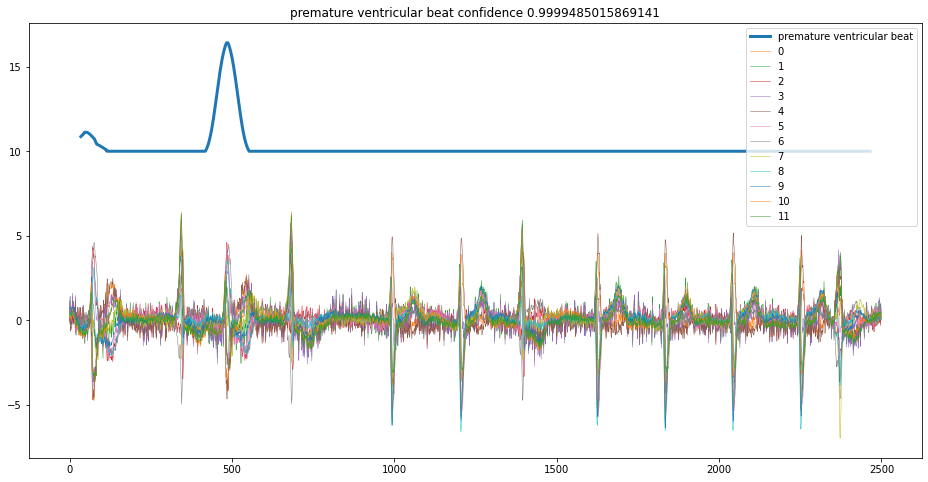

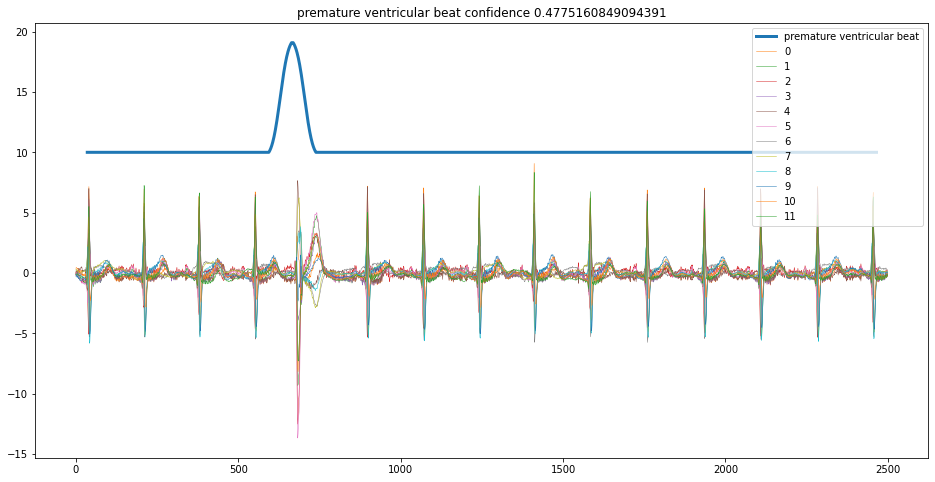

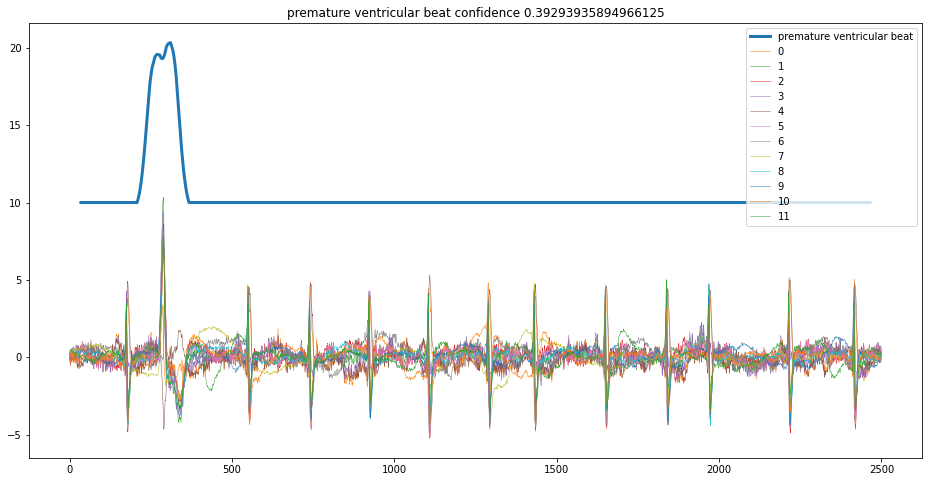

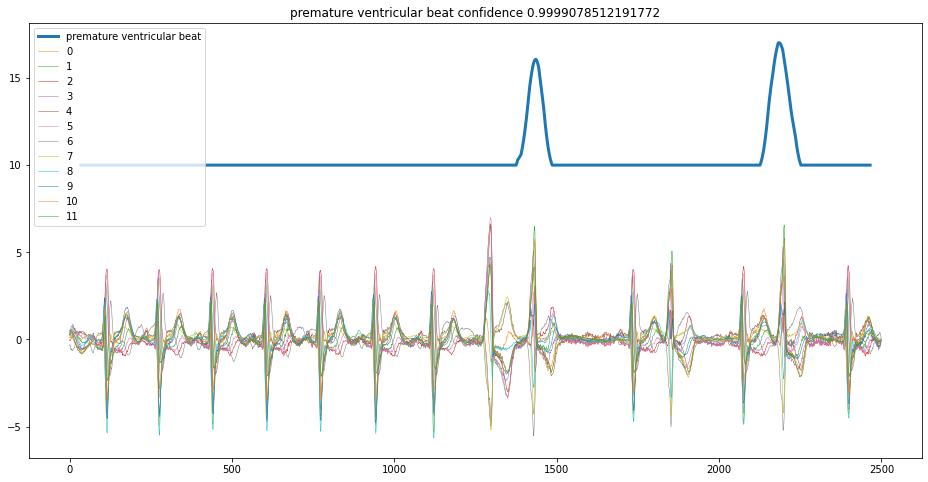

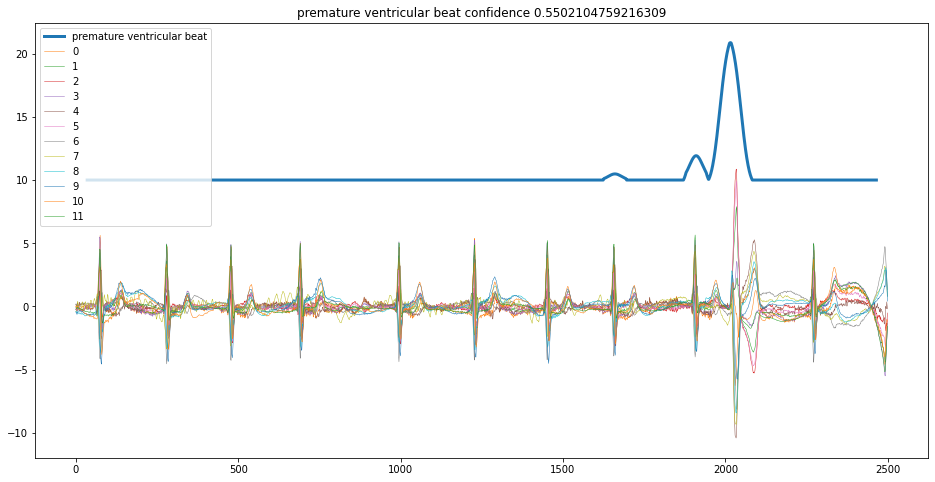

...

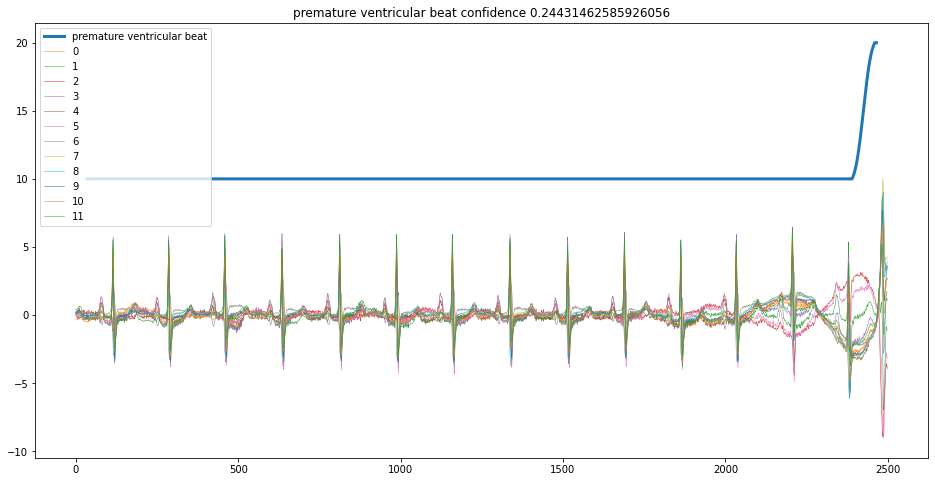

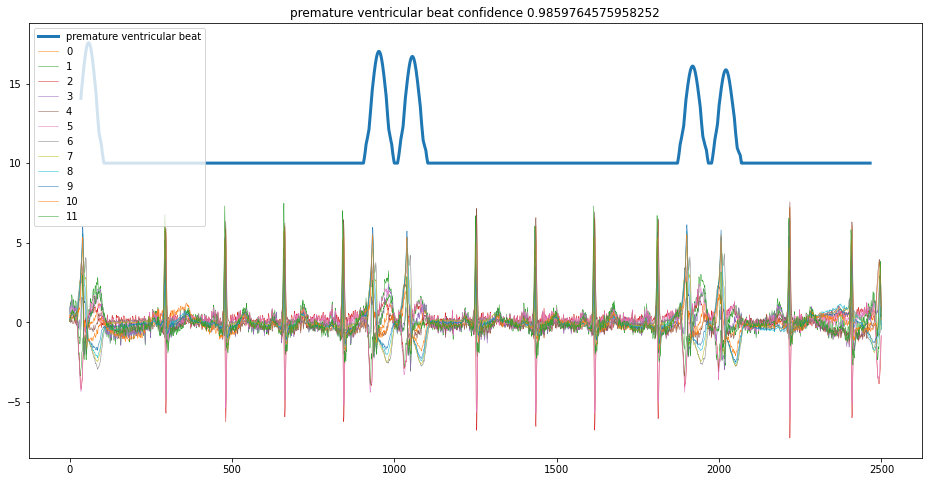

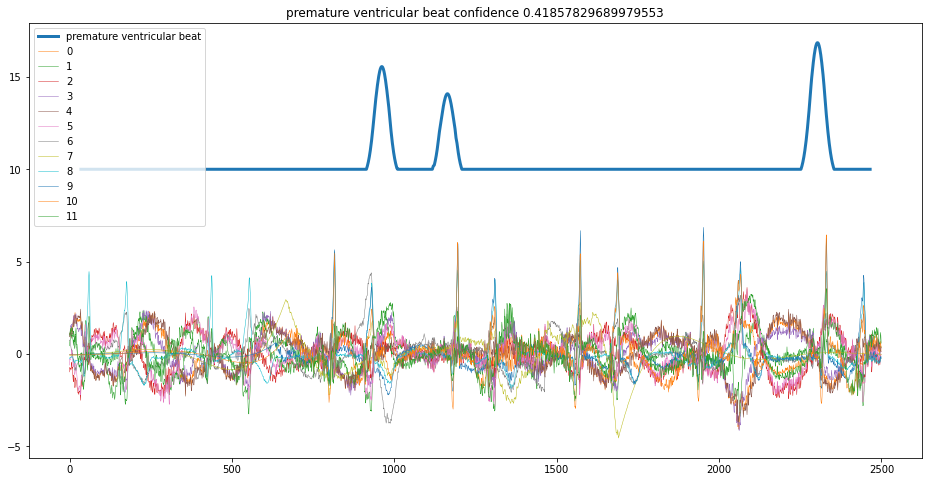

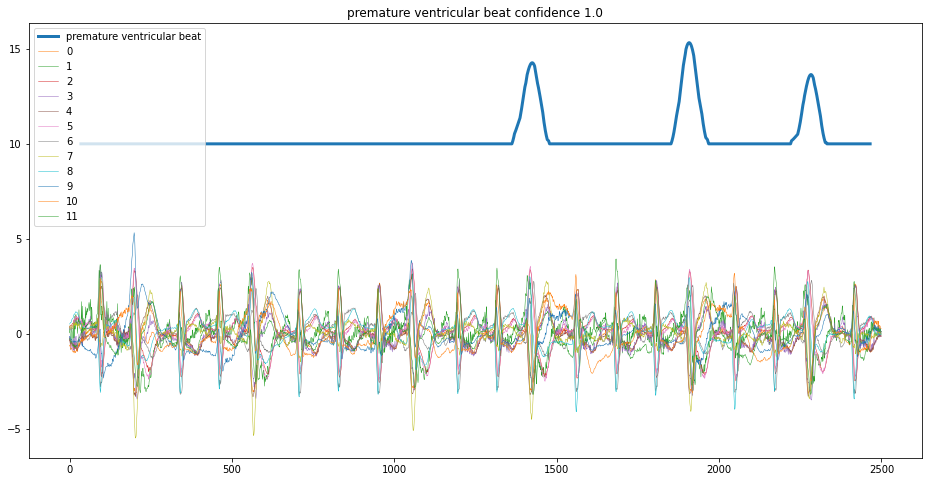

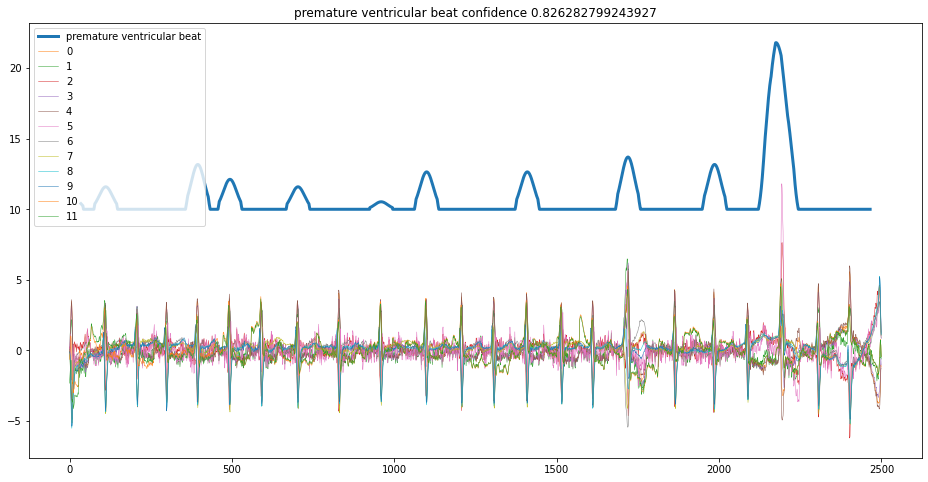

In [ ]:
type_ = 'test'
x_arr = np.swapaxes(datasets['x'][type_], 1, 2)
head_size = 1e10
for id_ in range(0, len(datasets['y'][type_]), 3):
    if datasets['y'][type_][id_] != 'premature ventricular beat' or head_size <= 0:
        continue
    head_size -= 1
    show_activation(x_arr[id_:id_+1], thresh_quantile=0.97)   #thresh=0.2222950220108032, 

## Run the search

In [ ]:
from bayes_opt import BayesianOptimization

# Bounded region of parameter space
def perform_hyper_search(y_to_use_, y_labels_, debug=False):
    """
    y_labels_: the first will be used to compute F1, the rest is just to see results
    """
    logit(f'\ny_to_use_:\n{y_to_use_}\n')
    gc.collect()  # Free up memory
    eps = 0.001   # a hack to do <a, b> intervals
    pbounds = {
        'max_extra_': (0, 2-eps),
        'max_duplicate_': (1, 3-eps),
        'mixup_alpha_': (0.0, 1.0),
        'num_of_cycles_': (15, 15.1),   # the search uses the best F1 anyways, no need to search over the num of cycles
        'cycle_len_': (1, 13-eps),          # could be increased to 20? 40 probably too much
        'bs_': (8, 48-eps),                 # should be turned into exponent
        'max_lr_': (1e-4, 5e-3),
    }
    if debug:
        pbounds = {
            'max_extra_': (0, 5-eps),
            'max_duplicate_': (1, 5-eps),
            'mixup_alpha_': (0.0, 1.0),
            'num_of_cycles_': (1, 1.1),    # the search uses the best F1 anyways, no need to search over the num of cycles
            'cycle_len_': (1, 1.1),        # could be increased to 20? 40 probably too much
            'bs_': (8, 64),                # should be turned into exponent
            'max_lr_': (1e-4, 5e-3),
        }

    optimizer = BayesianOptimization(
        f=generate_eval_hyperparams(ALL_DIAGNOSIS.difference(y_to_use_), y_labels_, k_avg=2),
        pbounds=pbounds,
        random_state=42,
    )
    
    optimizer.maximize(
        init_points=10,
        n_iter=40,
    )
    gc.collect()  # Free up memory
    
    print(optimizer.max)
    df = pd.DataFrame([x['params'] for x in optimizer.res])
    df['f1'] = [x['target'] for x in optimizer.res]
    df = df.sort_values('f1', ascending=False)
    display(df)
    return df

In [ ]:
y_to_use_search_space = {
#     'binary': ['premature ventricular beat',],
#     'ternary': ['premature ventricular beat', 'sinus rhythm'],
    'reasonable': [
        'sinus rhythm', 
#         'noisy ECG', 
        'tachycardia', 
        'myocardial infarction',
        'bradycardia', 
#         'STT changes', 
        'atrial fibrillation', 
        'premature atrial beat',
        'premature ventricular beat',   # Of interest
    ],    
    'all_reasonable': [
        'sinus rhythm', 
        'noisy ECG', 
        'tachycardia', 
        'myocardial infarction',
        'bradycardia', 
        'STT changes', 
        'atrial fibrillation', 
        'premature atrial beat',
        'premature ventricular beat',   # Of interest
    ],
#     'all': [
#         'sinus rhythm', 
#         'noisy ECG', 
#         'tachycardia', 
#         'myocardial infarction',
#         'bradycardia', 
#         'STT changes', 
#         'atrial fibrillation', 
#         'premature atrial beat',
#         'premature ventricular beat',   # Of interest
#         'left bundle brunch block', 
#         '1st degree AV block',
#         'right bundle brunch block', 
#         'supraventricular rhythm',
#         'ventricular stimulation', 
#         'atrial flutter', 
#         'atrial stimulation',
#         'ventricular preexcitation',
#         'atrial rhythm',
#         '3rd degree AV block',
#         '2nd degree AV block',
#         'non-specific intraventricular block',
#         'ventricular rhythm',
#         'SA block',
#         'ventricular trigeminy'
#     ]
}

y_labels_ = ['premature ventricular beat', 'premature atrial beat', 'atrial fibrillation']
for output_name_, y_to_use_ in y_to_use_search_space.items():
    df = perform_hyper_search(y_to_use_, y_labels_, debug=False)  # TODO: debug=False !!!
    df.to_csv(data_folder / f'{output_name_}.csv', index=False)

In [ ]:
!ls data

In [ ]:
df = pd.read_csv(data_folder / 'reasonable.csv', )
df

In [ ]:
df.iloc[0].to_dict()

In [ ]:
print(optimizer.max)
for i, res in enumerate(list(optimizer.res)[:10]):
    print("Iteration {}: \n\t{}".format(i, res))
print(optimizer.max)
pickle.dump(list(optimizer.res), open(data_folder / 'search_res.pkl','wb'))

In [ ]:
res = pickle.load(open(data_folder / 'search_res.pkl','rb'))
df = pd.DataFrame([x['params'] for x in res])
df['f1'] = [x['target'] for x in res]
df = df.sort_values('f1', ascending=False)
df.to_csv()

In [ ]:
best_hyper = {'bs_': 18.45702114214058,
 'cycle_len_': 7.439603784503289,
 'max_duplicate_': 3.12327443248267,
 'max_extra_': 3.1219158581093835,
 'mixup_alpha_': 0.31335505476578823,
 'num_of_cycles_': 15.02712020169596,
#  'f1': 0.8307692307692308
}

generate_eval_hyperparams(Y_TO_DROP_)(**best_hyper)

In [ ]:
!pip install benderopt

In [ ]:
from benderopt import minimize
import numpy as np
import logging

logging.basicConfig(level=logging.DEBUG) # logging.INFO will print less information

# We want to minimize the sinus function between 0 and 2pi
def f(x):
    return np.sin(x)

# We define the parameters we want to optimize:
optimization_problem_parameters = [
    {
        "name": "x", 
        "category": "uniform",
        "search_space": {
            "low": 0,
            "high": 2 * np.pi,
        }
    }
]

# We launch the optimization
best_sample = minimize(f, optimization_problem_parameters, number_of_evaluation=50)

print(best_sample["x"], 3 * np.pi / 2)

In [ ]:
# y_to_drop_, mixup_alpha_, num_of_cycles_, cycle_len_, bs_
optimization_problem_parameters = [
    {
        "name": "keep_col0", 
        "category": "categorical",
        "search_space": {
            "values": ["a", "b", "c", "d"],
            # "probabilities": [0.1, 0.2, 0.2, 0.2, 0.3]
        }
    },
    {
        "name": "mixup_alpha_", 
        "category": "uniform",
        "search_space": {
            "low": 0,
            "high": 0.6,
        }
    },
    {
        "name": "num_of_cycles_", 
        "category": "uniform",
        "search_space": {
            "low": 1,
            "high": 4,
        }
    },
    {
        "name": "cycle_len_", 
        "category": "uniform",
        "search_space": {
            "low": 1,
            "high": 20,
        }
    },
    {
        "name": "bs_", 
        "category": "uniform",
        "search_space": {
            "low": 8,
            "high": 256,
        }
    },
]

# We want to minimize the sinus function between 0 and 2pi
def f(**kwargs):
    print(kwargs)
    return - (kwargs['bs_'] + kwargs['cycle_len_'])

# We launch the optimization
best_sample = minimize(f, optimization_problem_parameters, number_of_evaluation=50)

print(best_sample["x"], 3 * np.pi / 2)